# Explainable ML and Human in the Loop interventions for the Automated Experiment (hAE): Deep Kernel Learning for STEM-EELS

- Initial workflow build by Yongtao Liu, https://scholar.google.com/citations?hl=en&user=V9FMPgQAAAAJ 
- Based on GPax library by Maxim Ziatdinov, https://scholar.google.com/citations?hl=en&user=YnSdOoUAAAAJ  
- Adapted for EELS by Kevin Roccapriore, https://scholar.google.com/citations?user=YnSdOoUAAAAJ
- Samples grown and prepared by Shin Hum Cho and Delia Milliron @ UT Austin
- Adapted by Sergei V. Kalinin (2023), https://scholar.google.com/citations?hl=en&user=-cuxoSQAAAAJ

If you are interested in GP/BO for automated experiment, check GPax repository (https://github.com/ziatdinovmax/gpax) and add your stars!

The additional details (for Piezoresponse Microscopy) can be found at: https://arxiv.org/abs/2302.06577

This notebook summarizes the forensic analysis of the Deep Kernel Learning (DKL) based automated experiment in STEM-EELS. Forensic analysis is the first step towards the explainable automated experiment, and aims to explore and visualize the experimental progression and the decision making made by the ML agent during the experiment. This is also a first step towards the human in the loop interventions, i.e. hAE. 

The reason why this analysis is necessary can be illustarted by the figure below. Human operator works on microscope by issuing the commands (position the probe, initiate scan, initiate spectrum acquisition, start grid measurements) directly to the microscope. The AI agent works similarly to human operator, generating the list of commands in microsocpe specific hyper-language. However, we still need to understand and control (human in the loop) the ML agent. One way to do it is to intervene and issue the contorl commands (direct intervention). The other is to control the behavior (policies) of the ML agent, meaning dynamically tuning the reward function, exploration-exploitation policies, etc. of the ML agent. This in turn requires tools for monitoring the automated experiment. This notebook presents these developments. 

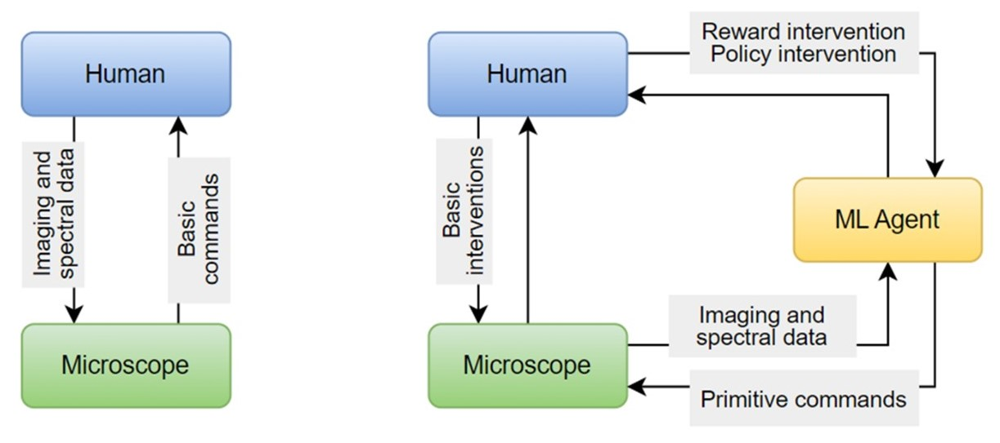

This version of the notebook introduces the primary explainable AE workflow including the active experiment and forensic analysis including learnign curve, regret, and real space trajectory analyses, feature discovery, and latent trajectory analysis. 

We leave more complex analyses including counterfactual analyses and policy tuning, as well as advanced monitoring methods based on the similarity searches, to more extended versions of the notebook.

# **1. Import and download data**

In [ ]:
#@title
%%capture
!pip install -q git+https://github.com/pycroscopy/atomai.git
# !pip install atomai
!pip install -q --upgrade git+https://github.com/ziatdinovmax/gpax

In [ ]:
#@title
import numpy as np
import matplotlib.pyplot as plt
import gpax
import numpyro
import jax
import jax.numpy as jnp
import math
import atomai as aoi
import torch
import os
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle

from atomai import utils
from sklearn.model_selection import train_test_split

## Load helper functions

In [ ]:
#@title
# Load helper functions 
from typing import Tuple

def make_window(imgsrc: np.ndarray, window_size: int,
                xpos: int, ypos: int) -> np.ndarray:
    """
    Returns the portion of the image within the window given the
    image (imgsrc), the x position and the y position
    """
    imgsrc = imgsrc[int(xpos-window_size/2):int(xpos+window_size/2),
                    int(ypos-window_size/2):int(ypos+window_size/2)]
    return imgsrc

def create_training_set(imgdata: np.ndarray, target: np.ndarray,
                        window_size: int) -> Tuple[np.ndarray]:
    """
    Creates arrays with features (local subimages)
    and targets (corresponding spectra) from hyperspectral data
    """
    feature_arr, target_arr = [], []
    pos = []
    s1, s2 = imgdata.shape[:-1]
    for i in range(s1):
        for j in range(s2):
            arr_loc = make_window(imgdata, window_size, i, j)
            if arr_loc.shape[:-1] != (window_size, window_size):
                continue
            feature_arr.append(arr_loc)
            target_arr.append(target[i, j])
            pos.append([i, j])
    return np.array(pos), np.array(feature_arr), np.array(target_arr)

from typing import Tuple, Optional, Dict, Union, List

def get_imgstack(imgdata: np.ndarray,
                 coord: np.ndarray,
                 r: int) -> Tuple[np.ndarray]:
    """
    Extracts subimages centered at specified coordinates
    for a single image
    Args:
        imgdata (3D numpy array):
            Prediction of a neural network with dimensions
            :math:`height \\times width \\times n channels`
        coord (N x 2 numpy array):
            (x, y) coordinates
        r (int):
            Window size
    Returns:
        2-element tuple containing
        - Stack of subimages
        - (x, y) coordinates of their centers
    """
    img_cr_all = []
    com = []
    for c in coord:
        cx = int(np.around(c[0]))
        cy = int(np.around(c[1]))
        if r % 2 != 0:
            img_cr = np.copy(
                imgdata[cx-r//2:cx+r//2+1,
                        cy-r//2:cy+r//2+1])
        else:
            img_cr = np.copy(
                imgdata[cx-r//2:cx+r//2,
                        cy-r//2:cy+r//2])
        if img_cr.shape[0:2] == (int(r), int(r)) and not np.isnan(img_cr).any():
            img_cr_all.append(img_cr[None, ...])
            com.append(c[None, ...])
    if len(img_cr_all) == 0:
        return None, None
    img_cr_all = np.concatenate(img_cr_all, axis=0)
    com = np.concatenate(com, axis=0)
    return img_cr_all, com


def extract_subimages(imgdata: np.ndarray,
                      coordinates: Union[Dict[int, np.ndarray], np.ndarray],
                      window_size: int, coord_class: int = 0) -> Tuple[np.ndarray]:

    if isinstance(coordinates, np.ndarray):
        coordinates = np.concatenate((
            coordinates, np.zeros((coordinates.shape[0], 1))), axis=-1)
        coordinates = {0: coordinates}
    if np.ndim(imgdata) == 2:
        imgdata = imgdata[None, ..., None]
    subimages_all, com_all, frames_all = [], [], []
    for i, (img, coord) in enumerate(
            zip(imgdata, coordinates.values())):
        coord_i = coord[np.where(coord[:, 2] == coord_class)][:, :2]
        stack_i, com_i = get_imgstack(img, coord_i, window_size)
        if stack_i is None:
            continue
        subimages_all.append(stack_i)
        com_all.append(com_i)
        frames_all.append(np.ones(len(com_i), int) * i)
    if len(subimages_all) > 0:
        subimages_all = np.concatenate(subimages_all, axis=0)
        com_all = np.concatenate(com_all, axis=0)
        frames_all = np.concatenate(frames_all, axis=0)

    return subimages_all, com_all, frames_all

def extract_patches_and_spectra(hdata: np.ndarray, *args: np.ndarray,
                                coordinates: np.ndarray = None,
                                window_size: int = None,
                                avg_pool: int = 2,
                                **kwargs: Union[int, List[int]]
                                ) -> Tuple[np.ndarray]:
    """
    Extracts image patches and associated spectra
    (corresponding to patch centers) from hyperspectral dataset
    Args:
        hdata:
            3D or 4D hyperspectral data
        *args:
            2D image for patch extraction. If not provided, then
            patches will be extracted from hyperspectral data
            averaged over a specified band (range of "slices")
        coordinates:
            2D numpy array with xy coordinates
        window_size:
            Image patch size
        avg_pool:
            Kernel size and stride for average pooling in spectral dimension(s)
        **band:
            Range of slices in hyperspectral data to average over
            for producing a 2D image if the latter is not provided as a separate
            argument. For 3D data, it can be integer (use a single slice)
            or a 2-element list. For 4D data, it can be integer or a 4-element list.
        Returns:
            3-element tuple with image patches, associated spectra and coordinates
    """
    F = torch.nn.functional
    if hdata.ndim not in (3, 4):
        raise ValueError("Hyperspectral data must 3D or 4D")
    if len(args) > 0:
        img = args[0]
        if img.ndim != 2:
            raise ValueError("Image data must be 2D")
    else:
        band = kwargs.get("band", 0)
        if hdata.ndim == 3:
            if isinstance(band, int):
                band = [band, band+1]
            img = hdata[..., band[0]:band[1]].mean(-1)
        else:
            if isinstance(band, int):
                band = [band, band+1, band, band+1]
            elif isinstance(band, list) and len(band) == 2:
                band = [*band, *band]
            img = hdata[..., band[0]:band[1], band[2]:band[3]].mean((-2, -1))
    patches, coords, _ = extract_subimages(img, coordinates, window_size)
    patches = patches.squeeze()
    spectra = []
    for c in coords:
        spectra.append(hdata[int(c[0]), int(c[1])])
    avg_pool = 2*[avg_pool] if (isinstance(avg_pool, int) & hdata.ndim == 4) else avg_pool
    torch_pool = F.avg_pool1d if hdata.ndim == 3 else F.avg_pool2d
    spectra = torch.tensor(spectra).cpu().unsqueeze(1)
    spectra = torch_pool(spectra, avg_pool, avg_pool).squeeze().numpy()
    return patches, spectra, coords

In [ ]:
#@title
# DKL specific functions

def plot_dkl(full_img, window_size, y, 
             dkl_mean, dkl_var):

    plt.figure(figsize=(15,15))
    gs = gridspec.GridSpec(1,3,width_ratios = [1,1,1])
    ax00,ax01,ax02 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[0,2])

    s1, s2 = full_img.shape[0] - window_size+1, full_img.shape[1] - window_size+1

    if y.ndim == 1:   # Scalar DKL
        original    = y.reshape(s1,s2)
        predicted   = dkl_mean.reshape(s1,s2)
        uncertainty = dkl_var.reshape(s1,s2)

    elif y.ndim == 2: # Vector DKL
        original    = np.swapaxes(y.reshape(-1,s1,s2).T, 0, 1)
        predicted   = np.swapaxes(dkl_mean.reshape(-1,s1,s2).T, 0, 1)
        uncertainty = np.swapaxes(dkl_var.reshape(-1,s1,s2).T, 0, 1)

    ax00.imshow(original)
    ax01.imshow(predicted)
    ax02.imshow(uncertainty)

    ax00.set_title("original")
    ax01.set_title("mean (prediction)")
    ax02.set_title("variance (uncertainty)")

    if y.ndim == 2: # we can show individual spectra. Otherwise, we've already scalarized it
        
        rng = np.random.default_rng()
        xx_ = rng.choice(s1, 3, replace = False)
        yy_ = rng.choice(s2, 3, replace = False)
        XY = np.asarray([xx_,yy_]).T
        
        x1,y1 = XY[0]
        x2,y2 = XY[1]
        x3,y3 = XY[2]

        ax00.scatter(x1,y1, c='dodgerblue', ec='k', s=100)
        ax00.scatter(x2,y2, c='darkorange', ec='k', s=100)
        ax00.scatter(x3,y3, c='crimson', ec='k', s=100)

        plt.figure(figsize=(10,5))
        ax = plt.gca()

        ax.plot(original[y1,x1], c='dodgerblue', lw = 2, ls ='--')
        ax.plot(original[y2,x2], c='darkorange', lw = 2, ls ='--')
        ax.plot(original[y3,x3], c='crimson', lw = 2, ls ='--')

        ax.plot(predicted[y1,x1], c='dodgerblue', lw = 2)
        ax.plot(predicted[y2,x2], c='darkorange', lw = 2)
        ax.plot(predicted[y3,x3], c='crimson', lw = 2)

        ax.axhline(0, c='k')
        ax.set_xlabel("Energy loss (eV)", fontsize = 22)
        ax.tick_params(length=5, width=3, labelsize = 18)





from typing import Union

def EI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: float = 0.01) -> np.ndarray:
    """
    Expected Improvement
    """
    device=model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, sigma = samples.mean(0), samples.var(0).sqrt()
    u = (mean - best_f.expand_as(mean) - xi) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()


def qEI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        best_f: Union[float, torch.Tensor], xi: float = 0.01,
        **kwargs: int) -> np.ndarray:
    """
    MC-based Expected Improvement
    """
    device = model.device
    dtype = model.dtype
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    obj = (obj - best_f.unsqueeze(-1).to(obj) - xi).clamp_min(0).detach().cpu()
    return obj.numpy()

def UCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: float = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta = torch.tensor(beta) if isinstance(beta, float) else beta
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, var = samples.mean(0), samples.var(0)
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()

def qUCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
         beta: float = 0.2, **kwargs: int) -> np.ndarray:
    """
    MC-based upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta_prime = math.sqrt(beta * math.pi / 2)
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    mean = obj.mean(dim=0)
    obj = mean + beta_prime * (obj - mean).abs()
    return obj.detach().cpu().numpy()


# Functions for plotting result, selecting next measurement point, and update train/test dataset
def sel_next_point (dklgp, X_train, X_test, xi):
  '''
  Function selects next_point_idx based on either EI
  acquision function (0) or maximum uncertainty point (1)
  '''
  global acq_idx
  if acq_idx == 0:  # 0 uses EI function
    best_f = torch.tensor(dklgp.predict(X_train)[0].max(), device=dklgp.device)
    obj = EI(dklgp, X_test, best_f, xi)
    next_point_idx = obj.mean(0).argmax()
  elif acq_idx == 1:  # 1 explores the max uncertainty point
    mean0, var0 = dklgp.predict(X_test, batch_size=len(X_test))
    next_point_idx = var0.argmax()
  elif acq_idx == 2:  # 2 uses UCB function
    obj = UCB(dklgp, X_test)
    next_point_idx = obj.mean(0).argmax()

  return next_point_idx

def update_train_test_data(X_train, X_test, y_train, y_test, 
                           indices_train, indices_test, 
                           next_point_idx, measured_point, next_point):
  X_train = np.append(X_train, X_test[next_point_idx][None], 0)
  X_test = np.delete(X_test, next_point_idx, 0)
  y_train = np.append(y_train, measured_point)
  y_test = np.delete(y_test, next_point_idx) 
  indices_train = np.append(indices_train, next_point[None], 0)
  indices_test = np.delete(indices_test, next_point_idx, 0)

  return (X_train, X_test, y_train, y_test, indices_train, indices_test)



# Define a function to run DKL exploration
def dkl_explore (save_explore, num_cycles = 200):
  global X, y, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Here X_train and y_train are our measured image patches and spectra information,
  # whereas X_test and y_test are the "unknown" ones. The indices_train are grid coordinates of the measured points,
  # whereas the indices_test are the grid coordinates of the remaining available points on the grid
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)
  print('X_train shape: '); print(X_train.shape)
  data_dim = X_train.shape[-1]

  if not os.path.exists(rf + acq_funcs[acq_idx] + save_explore):
    os.mkdir(rf + acq_funcs[acq_idx] + save_explore)
  os.chdir(rf + acq_funcs[acq_idx] + save_explore)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, y_train = y_train, 
           y_test = y_test, indices_train = indices_train, indices_test = indices_test)

  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # Update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles)
    
    mean, var = dklgp.predict(X, batch_size=len(X))
    # plot_dkl_result(y, mean, var, indices=indices_train, 
    #                 ws = ws, scatter_location = True)

    plot_dkl(img, window_size, y, mean, var)
    # Compute acquisition function
    next_point_idx = sel_next_point (dklgp, X_train, X_test, xi)
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]
    # Plot current result

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train, 
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)
    
    # Save result
    np.savez("record{}.npz".format(e), 
             mean = mean, var = var, next_point_idx = next_point_idx, 
             next_point = next_point, measured_point = measured_point)
  # Save final traindata
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test, 
           y_train = y_train, y_test = y_test, 
           indices_train = indices_train, indices_test = indices_test)
  




def dkl_counterfactual(y, save_counter, num_cycles = 200):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)
  
  # Set path for saving result 
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_counter):
    os.mkdir(rf + acq_funcs[acq_idx] + save_counter)
  
  # Save initial train data 
  os.chdir(rf + acq_funcs[acq_idx] + save_counter)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, 
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)
  
  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles, lr = 0.01)
    
    mean, var = dklgp.predict(X, batch_size=len(X))
    # plot_dkl_result(y, mean, var, indices=indices_train, 
    #                 ws = ws, scatter_location = True)
    plot_dkl(img, window_size, y, mean, var)
    
    #########################################################
    #################### Critical step ######################
    #########################################################

    # Load measurement locations from Step 1
    os.chdir(rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(e))
    next_point_idx = rec['next_point_idx']
    next_point = indices_test[next_point_idx]
    #########################################################
    #########################################################

    # Do "measurement"
    measured_point = y_test[next_point_idx]

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test, 
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)
    
    # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_counter)
    np.savez("record{}.npz".format(e), 
             mean = mean, var = var, next_point_idx = next_point_idx, 
             next_point = next_point, measured_point = measured_point)

  # Save final traindata
  os.chdir(rf + acq_funcs[acq_idx] + save_counter)
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)


# Define a function to run dkl analysis with random sampling
def dkl_random(y, save_random, num_cycles = 200):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)
  
  # Set path for saving result 
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_random):
    os.mkdir(rf + acq_funcs[acq_idx] + save_random)
  
  # Save initial train data 
  os.chdir(rf + acq_funcs[acq_idx] + save_random)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, 
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)
  
  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles, lr = 0.01)
    
    mean, var = dklgp.predict(X, batch_size=len(X))
    # plot_dkl_result(y, mean, var, indices=indices_train, 
    #                 ws = ws, scatter_location = True)
    plot_dkl(img, window_size, y, mean, var)
    
    #########################################################
    #################### Critical step ######################
    #########################################################
    next_point_idx = np.random.randint(len(X_test))
    next_point = indices_test[next_point_idx]
    #########################################################
    #########################################################

    # Do "measurement"
    measured_point = y_test[next_point_idx]

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test, 
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)
    
    # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_random)
    np.savez("record{}.npz".format(e), 
             mean = mean, var = var, next_point_idx = next_point_idx, 
             next_point = next_point, measured_point = measured_point)

  # Save final traindata
  os.chdir(rf + acq_funcs[acq_idx] + save_random)
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)
  



# Define a function to run dkl counterfactual with different scalarizer
def dkl_mature_full(y, save_mature_full, num_cycles = 200):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  
  # Load last step train dataset  
  os.chdir(rf + acq_funcs[acq_idx] + save_explore)
  rec = np.load("final_traindata.npz")
  X_train = rec["X_train"]
  y_train = rec["y_train"]

  # Train a matured DKL model with the last step train dataset
  # dklgp0 will be the matured DKL model
  dklgp0 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
  dklgp0.fit(X_train, y_train, training_cycles=num_cycles)

  # Train a full-informed DKL model with all data
  # dklgp1 will be the full-informed DKL model
  dklgp1 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
  dklgp1.fit(X, y, training_cycles=num_cycles)

  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)

  # Set path for saving result 
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_mature_full):
    os.mkdir(rf + acq_funcs[acq_idx] + save_mature_full)

  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    #update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles, lr = 0.01)
    
    mean, var = dklgp.predict(X_test, batch_size=len(X_test))  #real-time DKL model
    mean0, var0 = dklgp0.predict(X_test, batch_size=len(X_test)) #matured DKL model
    mean1, var1 = dklgp1.predict(X_test, batch_size=len(X_test)) #full-informed DKL model

    # Load measurement location from Step 1
    os.chdir(rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(e))
    next_point_idx = rec['next_point_idx']
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]

        # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_mature_full)
    np.savez("record{}.npz".format(e), y_test = y_test, 
             mean = mean, var = var, 
             mean0 = mean0, var0 = var0, 
             mean1 = mean1, var1 = var1)
    
    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train, 
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test, 
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point = next_point)
    

## Download STEM-EELS data

In [ ]:
%%capture
!wget https://www.dropbox.com/s/nicyvttpihzh1cd/Plasmonic_sets_7222021_fixed.npy
NPs = np.load("Plasmonic_sets_7222021_fixed.npy", allow_pickle=True).tolist()

After all the necessary libraries are installed and helper functions are defined, lets have a look at the data. This is standard hyperspectral EELS images of plasmonic nanoparticles. For those curious about these details, the data is collected on the NION MACSTEM at ORNL at 60 kV beam energy and ~30 mrad semiconvergence angle. The monochromated FWHM's is varying from 10 meV to 160 meV. Probe current of ~50 pA depending on level of monochromation. 

In [ ]:
## Inspect the data structure

print(f"Keys in NPs: {NPs.keys()}\n")

for key,val in NPs['1'].items():
    print(key)

Keys in NPs: dict_keys(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12'])

image
spectrum image
energy axis
scale


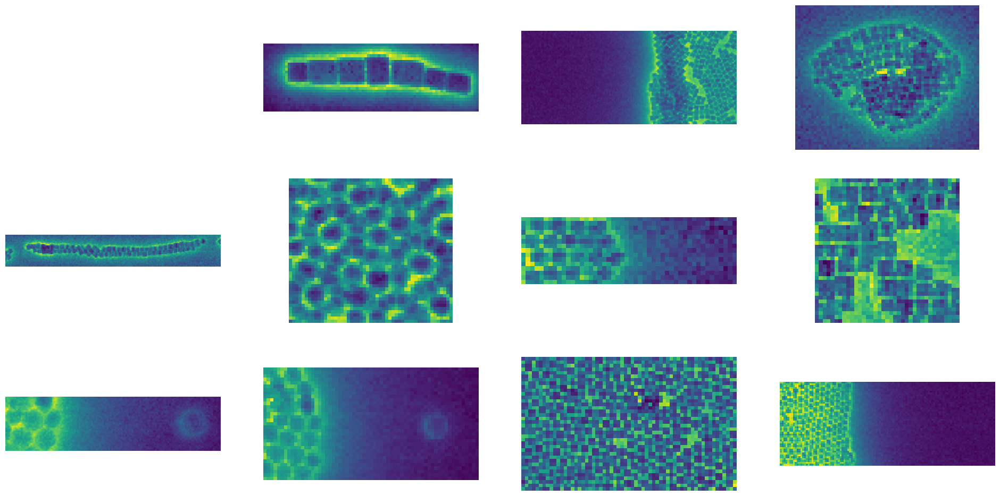

In [ ]:
## Survey the data ##

num_im = len(NPs)

rows = int(np.ceil(float(num_im)/5))
cols = int(np.ceil(float(num_im)/rows))

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (6*cols, 3*(1+rows)))   
for kk in range(1,num_im):
    ax = fig.add_subplot(gs[kk])
    img = np.mean(NPs['{}'.format(kk)]['spectrum image'], axis=2)
    ax.imshow(img)
    ax.axis('off')

Now, let's pick one data set. Depending on your curiosity, the interetsing ones can be 1, 2, 3, and 9. Note one important thing - when we run the DKL AE on the pre-acquired data, we are using the "dummy strucutral image" that we get from the EELS data set, which has very poor spatial resolution and sampling. In actual AE, we would use the real structural image.

(33, 63, 4322)

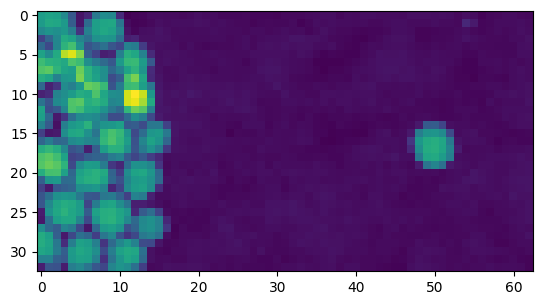

In [ ]:
key = 9

specim   = NPs[f'{key}']['spectrum image']
eax      = NPs[f'{key}']['energy axis']
pxsizenm = NPs[f'{key}']['scale']
img      = NPs[f'{key}']['image']

plt.imshow(img)
specim.shape

Now, let's use the AtomAI library to create the patches and corresponding spectra centered at the patches. The patches are the features in DKL, and all patches are available in the beginning of the experiment (we have strucutral data). Spectra are targets, and are available one by one. The purpose of DKL experiment is, given all patches and some of the spectra, suggest the next point where to take the measurements. Very similar task for any other active learning - except that the nature of the search spaces and discovered functionalities is different. 

In [ ]:
window_size       = 8           # select window size for geometric feature length scales
spectralavg       = 4            # default: 4. average spectral channels (reduces # of channels significantly --> easier to process! usually don't need 2048 ch, a few hundred I think are sufficient - depends on your feature spectral sizes really))


coordinates = aoi.utils.get_coord_grid(img, step = 1, return_dict=False)
patches, spectra, coords = extract_patches_and_spectra(specim, img,
                                                       coordinates=coordinates,
                                                       window_size=window_size,
                                                    #  band=[0, 2], # average over these slices and use as "structural data"
                                                       avg_pool=spectralavg)

print(spectra.shape)
print(coords.shape)
print(patches.shape)

ws = window_size # For convenience later...

(1456, 1080)
(1456, 2)
(1456, 8, 8)


<ipython-input-3-8aa05a850db5>:161: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  spectra = torch.tensor(spectra).cpu().unsqueeze(1)


In [ ]:
# Not necessary, just placing into 'standard' nomenclature

full_img    = np.copy(img)
indices     = np.copy(coords)
features    = np.copy(patches)
targets     = np.copy(spectra)
scale       = np.copy(pxsizenm)

e_axis      = np.copy(eax[::spectralavg])

while e_axis.shape[0] > spectra[0].shape[0]:
  e_axis = e_axis[:-1]
  
e_axis.shape, targets[0].shape

((1080,), (1080,))

Now, we can have a look what the training = (target, feature) data looks like. Again, all features are available to DKL, but targets are becoming available sequentially and the algorithm identifies for which of the uexplored patches to request the spectrum. 

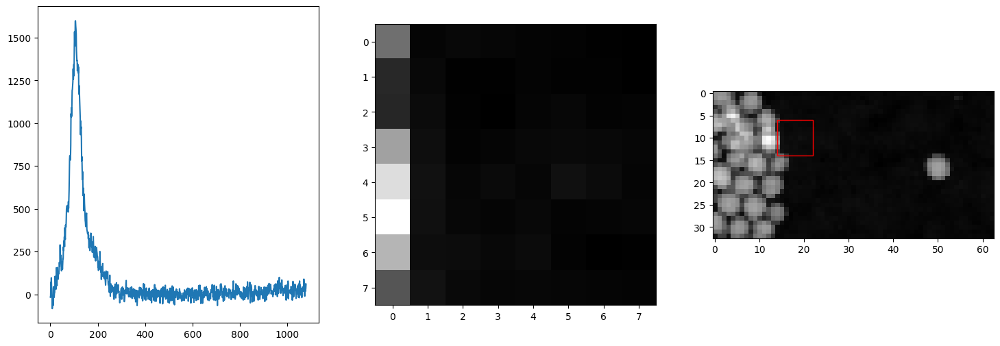

In [ ]:
k = 350

f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(18,6))
ax1.plot(targets[k])
ax2.imshow(features[k], cmap = 'gray')
ax3.imshow(full_img, cmap = 'gray')
ax3.add_patch(Rectangle([indices[k][1] - window_size / 2, indices[k][0] - window_size / 2], window_size, window_size, fill = False, ec = 'r'))

In [ ]:
features.shape, targets.shape

((1456, 8, 8), (1456, 1080))

Normalize data. Here the important thing is that normalization matters, and full normalization is possible after the experiment. So in real experiment we either normalize based on first measurement, or normalize everyything from zero to one. As can be expected, if the data is normalized based on first measurement then intensity becomes an important factor. If everything is normalized [0,1], then algorithm explores more subtle details of spectra.

In [ ]:
norm_ = lambda x: (x - x.min()) / x.ptp()
features, targets = norm_(features), norm_(targets)

# **2. Create scalarizers**

Now, remember that DKL AE is actually a bayesian optimization workflow, namely we seek to optimize the specific aspect of spectrum. For example, we may seek to maximize the ration of certain peak, some peak intensity, or any other fucntional of spectrum. This is accomplished via **scalarizer** function. The way AE works is the DKL on image patch -> (spectrum) -> scalarized spectrum. We store patches and spectra as **experimental trace**, but use scalarizer to guide the DKL. 

Let's scalarize our vactor-valued targets. Here we are going to do the scalarization by simply using the intensity of largest plasmonic peak but more sophisticated scalar descritpors can be derived as well (ratio of peaks, etc.). First do it for a single spectrum:

In [ ]:
def normalize(x):
    return (x-np.min(x))/np.ptp(x)

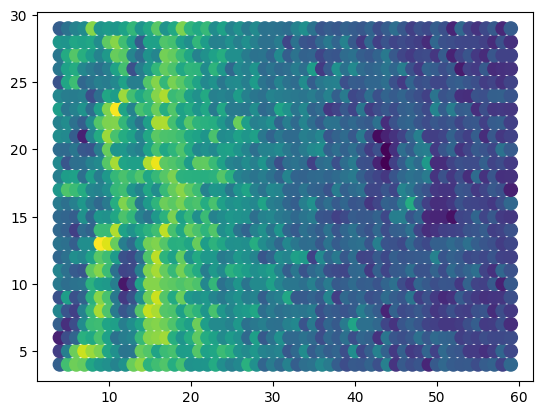

In [ ]:
# (coupled) dipole mode

band = [0.3, 0.4]

e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
peaks_all_scalar1, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = np.max(t[e1:e2])
    peaks_all_scalar1.append(np.array([peak]))
    features_all.append(features[i])
    indices_all.append(indices[i])

peaks_all_scalar1 = normalize(np.concatenate(peaks_all_scalar1))
features_all      = np.array(features_all)
indices_all       = np.array(indices_all)

plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all_scalar1, s = 90)

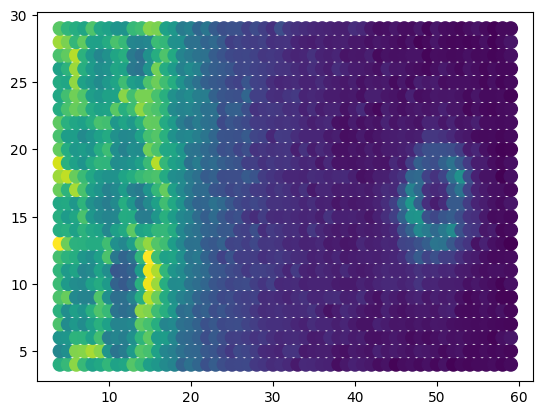

In [ ]:
## Edge mode
band = [0.65, 0.75]

e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
peaks_all_scalar2, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = np.max(t[e1:e2])
    peaks_all_scalar2.append(np.array([peak]))
    features_all.append(features[i])
    indices_all.append(indices[i])

peaks_all_scalar2 = normalize(np.concatenate(peaks_all_scalar2))
features_all      = np.array(features_all)
indices_all       = np.array(indices_all)

plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all_scalar2, s = 90)

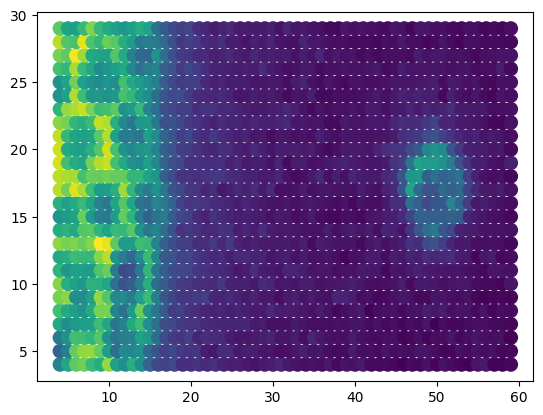

In [ ]:
## Bulk / face mode
band = [0.85, 0.95]

e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
peaks_all_scalar3, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = np.max(t[e1:e2])
    peaks_all_scalar3.append(np.array([peak]))
    features_all.append(features[i])
    indices_all.append(indices[i])

peaks_all_scalar3 = normalize(np.concatenate(peaks_all_scalar3))
features_all      = np.array(features_all)
indices_all       = np.array(indices_all)

plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all_scalar3, s = 90)

Preprocess:

In [ ]:
dklgp = None  # Reset any model, may help clear memory

y = np.copy(peaks_all_scalar1)
n, d1, d2 = features.shape
X = features.reshape(n, d1*d2)

print(y.shape)#, e_reduced.shape)
print(X.shape)
print(peaks_all_scalar1.shape)

(1456,)
(1456, 64)
(1456,)


# **3. DKL on full data (complete model)**

As a first step, let's initialize and train DKL-GPR model on the **<font color = 'dodgerblue'>FULL</font>** dataset. This is impossible for AE, but it creates a **complete** model - trained on all the data that can be obtained from this region. We can use this full model to check how fast the **live** (real time) model works. 

Here, we introduce three definitions:
- **Live model**: the actual model that is being trained during the experiment
- **Final model**: the model available in the end of experiment
- **Complete model**: model that is trained if full data is availabel (i.e. via grid measurement)

## Full DKL with 2 embedding dimensions

In [ ]:
data_dim = X.shape[-1]

dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp.fit(X, y, training_cycles=200, lr=1e-2)

/usr/local/lib/python3.10/dist-packages/linear_operator/utils/sparse.py:51: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  if nonzero_indices.storage():


Epoch 1/200 ... Training loss: 0.7622
Epoch 10/200 ... Training loss: 0.7307
Epoch 20/200 ... Training loss: 0.6943
Epoch 30/200 ... Training loss: 0.6553
Epoch 40/200 ... Training loss: 0.6225
Epoch 50/200 ... Training loss: 0.5841
Epoch 60/200 ... Training loss: 0.5429
Epoch 70/200 ... Training loss: 0.5029
Epoch 80/200 ... Training loss: 0.4641
Epoch 90/200 ... Training loss: 0.4164
Epoch 100/200 ... Training loss: 0.3766
Epoch 110/200 ... Training loss: 0.3347
Epoch 120/200 ... Training loss: 0.2866
Epoch 130/200 ... Training loss: 0.2417
Epoch 140/200 ... Training loss: 0.1977
Epoch 150/200 ... Training loss: 0.1523
Epoch 160/200 ... Training loss: 0.1097
Epoch 170/200 ... Training loss: 0.0665
Epoch 180/200 ... Training loss: 0.0211
Epoch 190/200 ... Training loss: -0.0265
Epoch 200/200 ... Training loss: -0.0696


Let's fit the model to data. Note that we already are starting to see interesting things - for example, for Spectrum 9 we see regions where variance is high - suggesting that something interesting is going on 

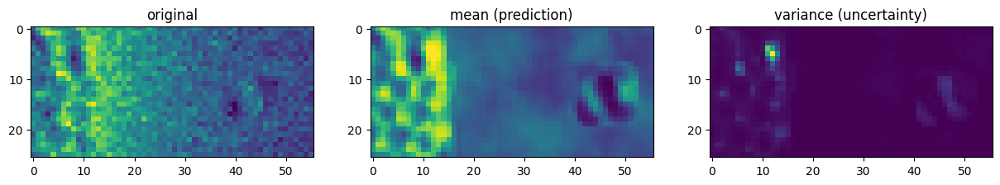

In [ ]:
mean, var = dklgp.predict(X, batch_size=len(X))
plot_dkl(img, window_size, y, mean, var)

And visualize the latent variables.

(-0.5, 55.5, -0.5, 25.5)

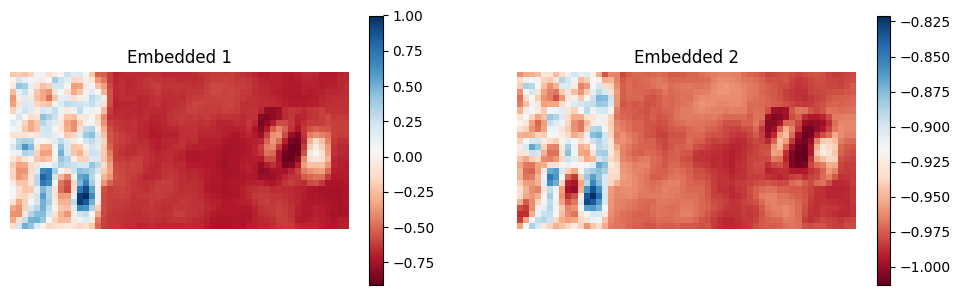

In [ ]:
s1,s2 = img.shape[0] - window_size + 1, img.shape[1] - window_size + 1

embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

cm = 'RdBu'
shrink = 0.7

im1 = ax1.imshow(embeded[:,0].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im1, ax=ax1, shrink = shrink)
ax1.set_title("Embedded 1")
ax1.axis('off')

im2 = ax2.imshow(embeded[:,1].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im2, ax=ax2, shrink = shrink)
ax2.set_title("Embedded 2")
ax2.axis('off')

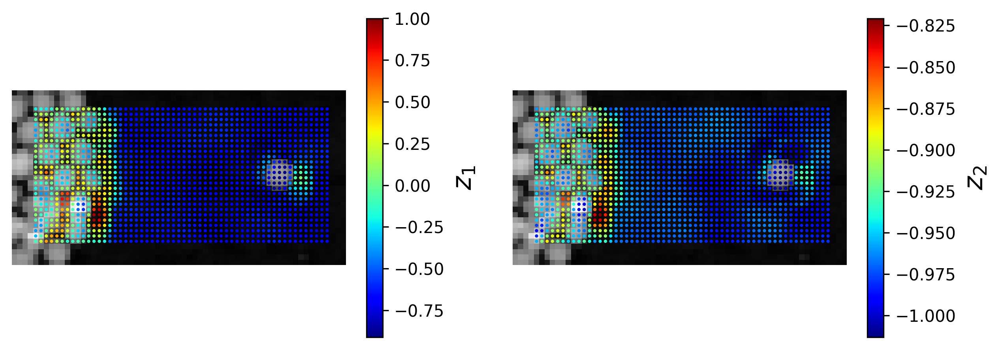

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), dpi = 300)
ax1.imshow(img, origin = "lower", cmap = 'gray')
im1=ax1.scatter(indices_all[:,1], indices_all[:,0], s=1, c = embeded[:,0].reshape(s1, s2), cmap = 'jet')
ax1.axis(False)
cbar1 = fig.colorbar(im1, ax=ax1, shrink=.7)
cbar1.set_label("$z_1$", fontsize=16)

ax2.imshow(img, origin = "lower", cmap = 'gray')
im2=ax2.scatter(indices_all[:,1], indices_all[:,0], s=1, c = embeded[:,1].reshape(s1, s2), cmap = 'jet')
ax2.axis(False)
cbar2 = fig.colorbar(im2, ax=ax2, shrink=.7)
cbar2.set_label("$z_2$", fontsize=16)

## Full DKL with 3 embedding dimensions

In [ ]:
# dklgp = None  # help to clear memory

In [ ]:
data_dim = X.shape[-1]

dklgp4 = aoi.models.dklGPR(data_dim, embedim=3, precision="double")
dklgp4.fit(X, y, training_cycles=200, lr=1e-2, batch_size = 32)

Epoch 1/200 ... Training loss: 0.7609
Epoch 10/200 ... Training loss: 0.7268
Epoch 20/200 ... Training loss: 0.6894
Epoch 30/200 ... Training loss: 0.65
Epoch 40/200 ... Training loss: 0.6136
Epoch 50/200 ... Training loss: 0.5739
Epoch 60/200 ... Training loss: 0.5311
Epoch 70/200 ... Training loss: 0.4933
Epoch 80/200 ... Training loss: 0.4496
Epoch 90/200 ... Training loss: 0.4052
Epoch 100/200 ... Training loss: 0.3644
Epoch 110/200 ... Training loss: 0.3204
Epoch 120/200 ... Training loss: 0.2754
Epoch 130/200 ... Training loss: 0.2325
Epoch 140/200 ... Training loss: 0.1834
Epoch 150/200 ... Training loss: 0.1405
Epoch 160/200 ... Training loss: 0.0945
Epoch 170/200 ... Training loss: 0.0471
Epoch 180/200 ... Training loss: 0.0039
Epoch 190/200 ... Training loss: -0.0441
Epoch 200/200 ... Training loss: -0.0871


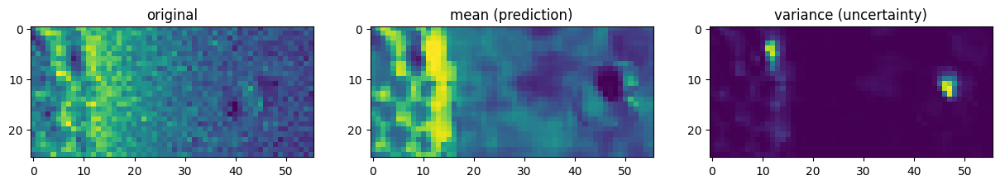

In [ ]:
mean4, var4 = dklgp4.predict(X, batch_size=len(X))
plot_dkl(img, window_size, y, mean4, var4)

(-0.5, 55.5, -0.5, 25.5)

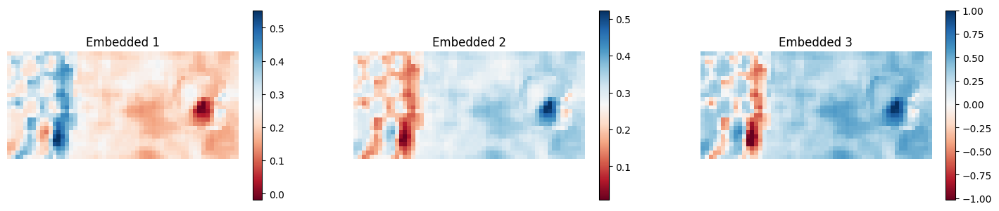

In [ ]:
s1,s2 = img.shape[0] - window_size + 1, img.shape[1] - window_size + 1

embeded4 = dklgp4.embed(X)
embeded4 = embeded4 / embeded4.max()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

cm = 'RdBu'
shrink = 0.7

im1 = ax1.imshow(embeded4[:,0].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im1, ax=ax1, shrink = shrink)
ax1.set_title("Embedded 1")
ax1.axis('off')

im2 = ax2.imshow(embeded4[:,1].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im2, ax=ax2, shrink = shrink)
ax2.set_title("Embedded 2")
ax2.axis('off')

im3 = ax3.imshow(embeded4[:,2].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im3, ax=ax3, shrink = shrink)
ax3.set_title("Embedded 3")
ax3.axis('off')

# **4. Active experiment**

Now, let's see how DKL will work for in the (simulated) automated experiment. We can select a single acquisition function (EI, MU, UCB), or explore all three. Also here we choose scalarizer 1. 

In [ ]:
## Some globals

exploration_steps = 100
num_cycles        = 100 

xi = 0.01  # balances exploration and explitation for EI and qEI
cm = 'viridis'
shrink = 0.7

ts = 0.995  # (0.9995 for key 3) test data size: # Adjust ts to be as small as possible without running into error
rs = 42   #random state determines initial train data, 42 because answer to everything

In [ ]:
y = np.copy(peaks_all_scalar1)

In [ ]:
# determine acqusition funciton, 
acq = 3  # 0 uses EI, 1 explores max uncertainty point, 2 uses UCB

rf = '/content/rf/'   #root folder
if not os.path.exists(rf):
    os.mkdir(rf)

acq_funcs = ['EI', 'MU', 'UCB']   #list corresponds to Func sel_next_point.
# root_folderEI = rf+"EI/"   
# root_folderMU = rf+"MU/"
# root_folderUCB = rf+"UCB/"
 
if acq == 3:             # when acq = 3, run all acq_funcs
  if not os.path.exists(rf + acq_funcs[0]):
    os.mkdir(rf + acq_funcs[0])
  if not os.path.exists(rf + acq_funcs[1]):
    os.mkdir(rf + acq_funcs[1])
  if not os.path.exists(rf + acq_funcs[2]):
    os.mkdir(rf + acq_funcs[2])
elif acq < 3:
  if not os.path.exists(rf + acq_funcs[acq]):  # change root folder name when you change acquistion funciton
    os.mkdir(rf + acq_funcs[acq])

## DKL exploration 



We run the DKL AE based on three scalarizers based on individual spectral bands:
- Band #1:`0.3 - 0.4 eV` 
- Band #2: `0.65 - 0.75 eV`
- Band #3: `0.85 - 0.95 eV`

We can run exploration using a single acquisition function. Alternatively, we can explore all three and compare results.

X_train shape: 
(7, 64)
1/100
Epoch 1/100 ... Training loss: 0.9834
Epoch 10/100 ... Training loss: 0.9191
Epoch 20/100 ... Training loss: 0.8598
Epoch 30/100 ... Training loss: 0.8004
Epoch 40/100 ... Training loss: 0.7435
Epoch 50/100 ... Training loss: 0.6907
Epoch 60/100 ... Training loss: 0.6399
Epoch 70/100 ... Training loss: 0.5897
Epoch 80/100 ... Training loss: 0.5394
Epoch 90/100 ... Training loss: 0.4888
Epoch 100/100 ... Training loss: 0.4379
2/100
Epoch 1/100 ... Training loss: 0.9703
Epoch 10/100 ... Training loss: 0.8972
Epoch 20/100 ... Training loss: 0.8442
Epoch 30/100 ... Training loss: 0.7915
Epoch 40/100 ... Training loss: 0.7388
Epoch 50/100 ... Training loss: 0.6889
Epoch 60/100 ... Training loss: 0.6403
Epoch 70/100 ... Training loss: 0.589
Epoch 80/100 ... Training loss: 0.5393
Epoch 90/100 ... Training loss: 0.4898
Epoch 100/100 ... Training loss: 0.4402
3/100
Epoch 1/100 ... Training loss: 0.9688
Epoch 10/100 ... Training loss: 0.8869
Epoch 20/100 ... Trainin

<ipython-input-4-8cbee11daee0>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,15))


Epoch 10/100 ... Training loss: 0.8226
Epoch 20/100 ... Training loss: 0.7808
Epoch 30/100 ... Training loss: 0.7372
Epoch 40/100 ... Training loss: 0.6954
Epoch 50/100 ... Training loss: 0.654
Epoch 60/100 ... Training loss: 0.6125
Epoch 70/100 ... Training loss: 0.5742
Epoch 80/100 ... Training loss: 0.5322
Epoch 90/100 ... Training loss: 0.4899
Epoch 100/100 ... Training loss: 0.4471
23/100
Epoch 1/100 ... Training loss: 0.8863
Epoch 10/100 ... Training loss: 0.8286
Epoch 20/100 ... Training loss: 0.7782
Epoch 30/100 ... Training loss: 0.7343
Epoch 40/100 ... Training loss: 0.6935
Epoch 50/100 ... Training loss: 0.6524
Epoch 60/100 ... Training loss: 0.6116
Epoch 70/100 ... Training loss: 0.5706
Epoch 80/100 ... Training loss: 0.5289
Epoch 90/100 ... Training loss: 0.4789
Epoch 100/100 ... Training loss: 0.4208
24/100
Epoch 1/100 ... Training loss: 0.8851
Epoch 10/100 ... Training loss: 0.8275
Epoch 20/100 ... Training loss: 0.7819
Epoch 30/100 ... Training loss: 0.7364
Epoch 40/100

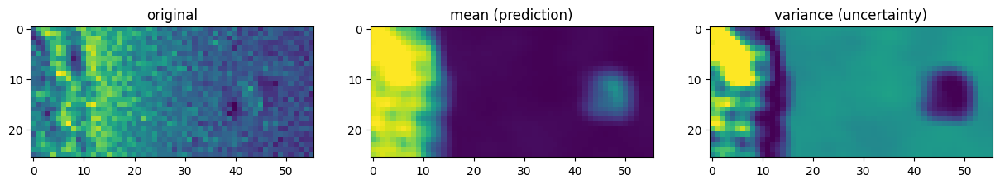

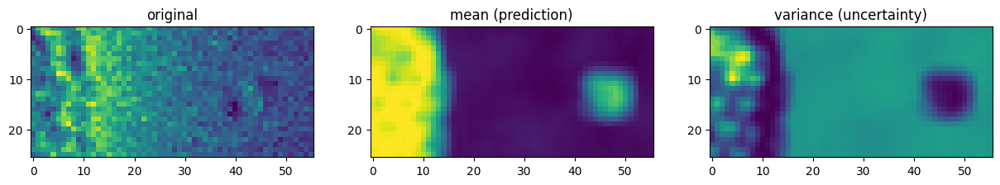

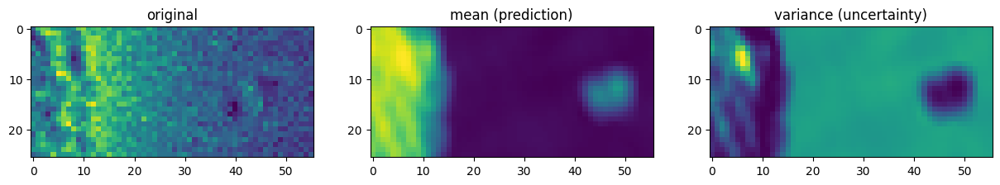

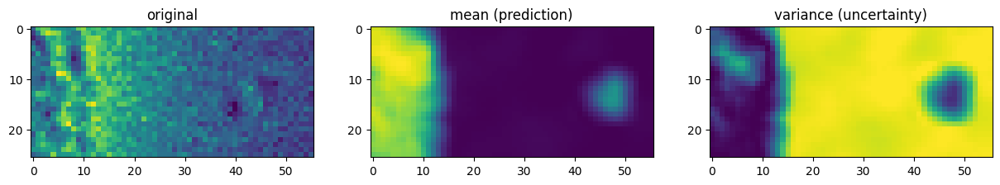

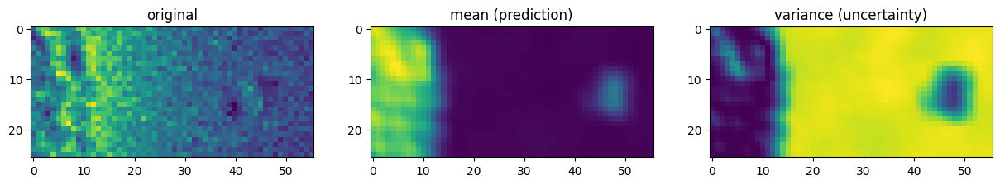

...

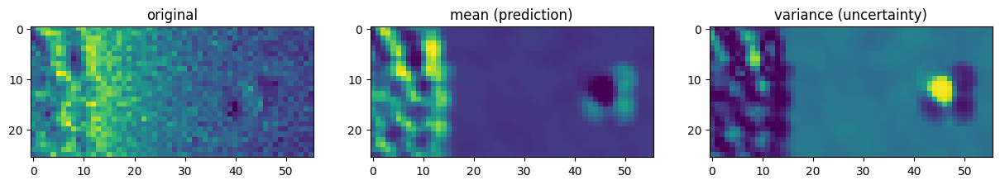

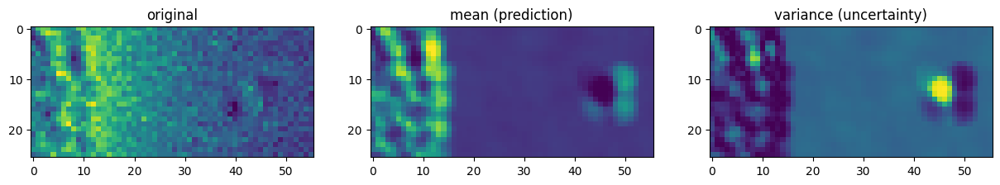

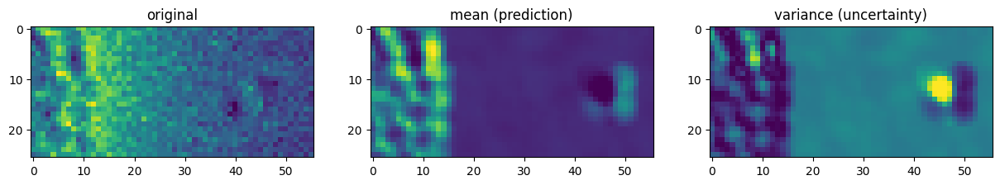

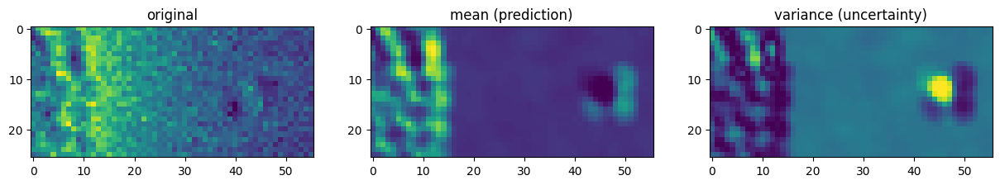

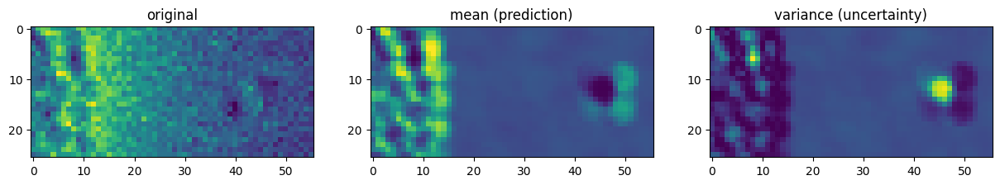

In [ ]:
save_explore =  "/explore_dkl_record/"

y_targ = peaks_all_scalar1    #training output; 
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

# run DKL exploration with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_explore(save_explore, num_cycles)   

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_explore(save_explore, num_cycles)

The exploration locations can be used for other analyses with different scalarizer functions (counterfactual analysis). We will not explore it in this notebook. 

## Complete model

Now we can run the DKL on band 1 to create the complete model. 

In [ ]:
# Band 1

y_targ = peaks_all_scalar1   #training output; 
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_mature_full = "/mature_full_record/"

# run real-time DKL, mature DKL, and full DKL with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_mature_full(y, save_mature_full, num_cycles)   

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_mature_full(y, save_mature_full, num_cycles)

Epoch 1/100 ... Training loss: 0.8281
Epoch 10/100 ... Training loss: 0.7738
Epoch 20/100 ... Training loss: 0.7366
Epoch 30/100 ... Training loss: 0.6949
Epoch 40/100 ... Training loss: 0.6556
Epoch 50/100 ... Training loss: 0.6166
Epoch 60/100 ... Training loss: 0.577
Epoch 70/100 ... Training loss: 0.5359
Epoch 80/100 ... Training loss: 0.4927
Epoch 90/100 ... Training loss: 0.4473
Epoch 100/100 ... Training loss: 0.3997
Epoch 1/100 ... Training loss: 0.7656
Epoch 10/100 ... Training loss: 0.7323
Epoch 20/100 ... Training loss: 0.6952
Epoch 30/100 ... Training loss: 0.6568
Epoch 40/100 ... Training loss: 0.6207
Epoch 50/100 ... Training loss: 0.5809
Epoch 60/100 ... Training loss: 0.5424
Epoch 70/100 ... Training loss: 0.504
Epoch 80/100 ... Training loss: 0.4654
Epoch 90/100 ... Training loss: 0.4216
Epoch 100/100 ... Training loss: 0.3807
1/100
Epoch 1/100 ... Training loss: 0.9834
Epoch 10/100 ... Training loss: 0.9191
Epoch 20/100 ... Training loss: 0.8598
Epoch 30/100 ... Train

## Zip and download all results


In [ ]:
!zip -r /content/Forensic_EELS_NP1_20explore.zip /content/rf   # zip the root folder

# Use this code if you would like to download the analysis to your computer
# from google.colab import files
# files.download("/content/Forensic_EELS_NP1_20explore.zip")

  adding: content/rf/ (stored 0%)
  adding: content/rf/MU/ (stored 0%)
  adding: content/rf/MU/mature_full_record/ (stored 0%)
  adding: content/rf/MU/mature_full_record/record89.npz (deflated 19%)
  adding: content/rf/MU/mature_full_record/record49.npz (deflated 18%)
  adding: content/rf/MU/mature_full_record/record79.npz (deflated 18%)
  adding: content/rf/MU/mature_full_record/record2.npz (deflated 18%)
  adding: content/rf/MU/mature_full_record/record62.npz (deflated 18%)
  adding: content/rf/MU/mature_full_record/record75.npz (deflated 18%)
  adding: content/rf/MU/mature_full_record/record76.npz (deflated 19%)
  adding: content/rf/MU/mature_full_record/record12.npz (deflated 18%)
  adding: content/rf/MU/mature_full_record/record42.npz (deflated 17%)
  adding: content/rf/MU/mature_full_record/record7.npz (deflated 25%)
  adding: content/rf/MU/mature_full_record/record67.npz (deflated 18%)
  adding: content/rf/MU/mature_full_record/record64.npz (deflated 18%)
  adding: content/rf/MU



# **5. Forensic analysis**

In [ ]:
#Use this code if you get locale error when !wget the previous analysis data

'''
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
'''

'\nimport locale\ndef getpreferredencoding(do_setlocale = True):\n    return "UTF-8"\nlocale.getpreferredencoding = getpreferredencoding\n'

In [ ]:
# If you would like to explore a stored data set
use_own_data = 'N'

%cd "/content/"
if use_own_data == "Y":
    !wget https://www.dropbox.com/s/2kqznxkui0ajdr2/Forensic_EELS_NP1_20explore.zip
    !unzip Forensic_EELS_NP1_20explore.zip

/content


Import PyroVED for the VAE analysis

In [ ]:
%%capture
!pip install --upgrade git+https://github.com/ziatdinovmax/pyroved.git

In [ ]:
import os
import glob
import h5py
from copy import deepcopy as dc

from scipy import ndimage
from sklearn import decomposition

import pyroved as pv

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import cv2

import atomai as aoi
from atomai.utils import extract_patches_ 
from atomai import utils

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

## Learning curve analysis

Load results of  **Live model** (the actual model that is being trained during the experiment), **Final model** (the model available in the end of experiment), and **Complete model** (trained on full data if it is available, i.e. via grid measurement)

In [ ]:
if use_own_data == 'Y':

    exploration_steps = len(glob.glob("content/rf/EI/random_band1/record*")) # This should be 20
    rf = "/content/rf/"
    print(exploration_steps )

In [ ]:
# Create array to save results of live and complete DKL models
# save results from EI acuqisition funciton

var_compare = np.empty((3, 3, exploration_steps))  # uncertainty
var_dev_compare = np.empty((3, 3, exploration_steps)) # uncertainty variation
nextpoint_uncertainty_compare = np.empty((3, 3, exploration_steps)) # predicted next point uncertainty
nextpoint_measure_compare = np.empty((3, 3, exploration_steps)) # next point ground truth 
nextpoint_pred_compare = np.empty((3, 3, exploration_steps)) # next point prediction

for acq_idx in range(3):
  os.chdir (rf + acq_funcs[acq_idx] + '/mature_full_record')

  for i in range (exploration_steps):
    # load results of DKL
    rec = np.load("record{}.npz".format(i))
    var_compare[acq_idx, :, i] = rec['var'].mean(), rec['var0'].mean(), rec['var1'].mean()
    var_dev_compare[acq_idx, :, i] = np.std(rec['var']), np.std(rec['var0']), np.std(rec['var1'])

    nextpoint_uncertainty_compare[acq_idx, :, i] = rec['var'].max(), rec['var0'].max(), rec['var1'].max()
    nextpoint_measure_compare[acq_idx, :, i] = rec['y_test'][rec['var'].argmax()], rec['y_test'][rec['var0'].argmax()], rec['y_test'][rec['var1'].argmax()]
    nextpoint_pred_compare[acq_idx, :, i] = rec['mean'][rec['var'].argmax()], rec['mean0'][rec['var0'].argmax()], rec['mean1'][rec['var1'].argmax()]

Plot preditive uncertainty (of each model) as a function of automated experiment step. Shown is the average uncertainty for all patches, and the distribution of uncertainties. 

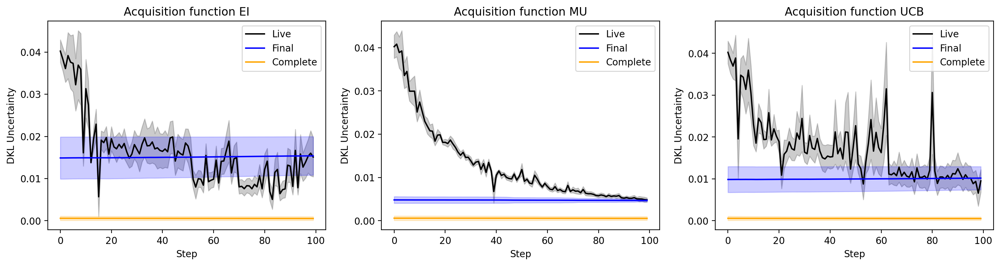

In [ ]:
s = np.arange(exploration_steps) #step

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (18, 4), dpi = 200)

#Plot EI
ax1.set_title("Acquisition function EI")
ax1.plot(s, var_compare[0, 0,], c= 'black', label = "Live")
ax1.fill_between(s, var_compare[0, 0,]-var_dev_compare[0, 0,], 
                 var_compare[0, 0,]+var_dev_compare[0, 0,], color='black', alpha=0.2)
ax1.plot(s, var_compare[0, 1,], c = 'blue', label = "Final")
ax1.fill_between(s, var_compare[0, 1,]-var_dev_compare[0, 1,],
                 var_compare[0, 1,]+var_dev_compare[0, 1,],  color='blue', alpha=0.2)
ax1.plot(s, var_compare[0, 2,], c = 'orange', label = "Complete")
ax1.fill_between(s, var_compare[0, 2,]-var_dev_compare[0, 2,],
                 var_compare[0, 2,]+var_dev_compare[0, 2,], color='orange', alpha=0.2)
ax1.set_ylabel("DKL Uncertainty")
ax1.set_xlabel('Step')
ax1.legend()

#Plot MU
ax2.set_title("Acquisition function MU")
ax2.plot(s, var_compare[1, 0,], c= 'black', label = "Live")
ax2.fill_between(s, var_compare[1, 0,]-var_dev_compare[1, 0,], 
                 var_compare[1, 0,]+var_dev_compare[1, 0,], color='black', alpha=0.2)
ax2.plot(s, var_compare[1, 1,], c = 'blue', label = "Final")
ax2.fill_between(s, var_compare[1, 1,]-var_dev_compare[1, 1,],
                 var_compare[1, 1,]+var_dev_compare[1, 1,],  color='blue', alpha=0.2)
ax2.plot(s, var_compare[1, 2,], c = 'orange', label = "Complete")
ax2.fill_between(s, var_compare[1, 2,]-var_dev_compare[1, 2,],
                 var_compare[1, 2,]+var_dev_compare[1, 2,], color='orange', alpha=0.2)
ax2.set_ylabel("DKL Uncertainty")
ax2.set_xlabel('Step')
ax2.legend()

#Plot UCB
ax3.set_title("Acquisition function UCB")
ax3.plot(s, var_compare[2, 0,], c= 'black', label = "Live")
ax3.fill_between(s, var_compare[2, 0,]-var_dev_compare[2, 0,], 
                 var_compare[2, 0,]+var_dev_compare[2, 0,], color='black', alpha=0.2)
ax3.plot(s, var_compare[2, 1,], c = 'blue', label = "Final")
ax3.fill_between(s, var_compare[2, 1,]-var_dev_compare[2, 1,],
                 var_compare[2, 1,]+var_dev_compare[2, 1,],  color='blue', alpha=0.2)
ax3.plot(s, var_compare[2, 2,], c = 'orange', label = "Complete")
ax3.fill_between(s, var_compare[2, 2,]-var_dev_compare[2, 2,],
                 var_compare[2, 2,]+var_dev_compare[2, 2,], color='orange', alpha=0.2)
ax3.set_ylabel("DKL Uncertainty")
ax3.set_xlabel('Step')
ax3.legend()

plt.show()

Now, let's plot the maximum uncertainty for each model as a function of step. In principle, we can also calculate the acquisition functions. 

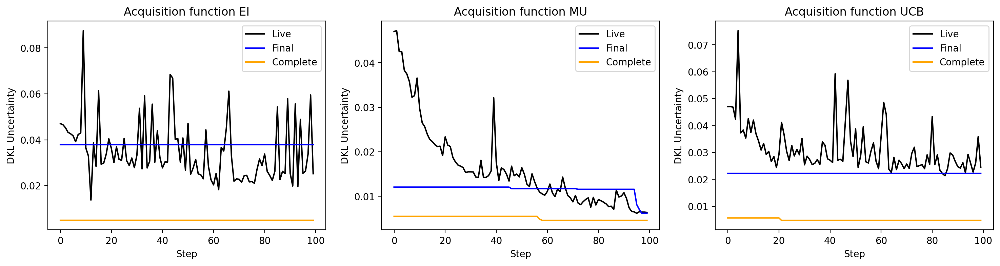

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("Acquisition function EI")
ax1.plot(s, nextpoint_uncertainty_compare[0, 0,], c= 'black', label = "Live")
ax1.plot(s, nextpoint_uncertainty_compare[0, 1,], c = 'blue', label = "Final")
ax1.plot(s, nextpoint_uncertainty_compare[0, 2,], c = 'orange', label = "Complete")
ax1.set_ylabel("DKL Uncertainty"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("Acquisition function MU")
ax2.plot(s, nextpoint_uncertainty_compare[1, 0,], c= 'black', label = "Live")
ax2.plot(s, nextpoint_uncertainty_compare[1, 1,], c = 'blue', label = "Final")
ax2.plot(s, nextpoint_uncertainty_compare[1, 2,], c = 'orange', label = "Complete")
ax2.set_ylabel("DKL Uncertainty"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("Acquisition function UCB")
ax3.plot(s, nextpoint_uncertainty_compare[2, 0,], c= 'black', label = "Live")
ax3.plot(s, nextpoint_uncertainty_compare[2, 1,], c = 'blue', label = "Final")
ax3.plot(s, nextpoint_uncertainty_compare[2, 2,], c = 'orange', label = "Complete")
ax3.set_ylabel("DKL Uncertainty"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Next measurement value from each model as a function of step. For now, the next point is simply defined as maximum uncertainty (we can also use EI or UCB function; or next point from experiment)

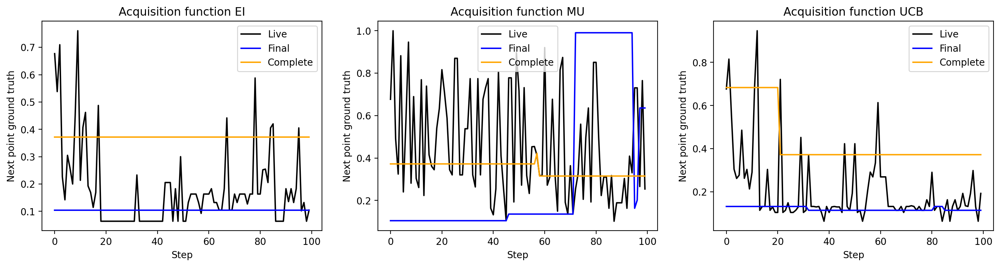

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("Acquisition function EI")
ax1.plot(s, nextpoint_measure_compare[0, 0,], c= 'black', label = "Live")
ax1.plot(s, nextpoint_measure_compare[0, 1,], c = 'blue', label = "Final")
ax1.plot(s, nextpoint_measure_compare[0, 2,], c = 'orange', label = "Complete")
ax1.set_ylabel("Next point ground truth"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("Acquisition function MU")
ax2.plot(s, nextpoint_measure_compare[1, 0,], c= 'black', label = "Live")
ax2.plot(s, nextpoint_measure_compare[1, 1,], c = 'blue', label = "Final")
ax2.plot(s, nextpoint_measure_compare[1, 2,], c = 'orange', label = "Complete")
ax2.set_ylabel("Next point ground truth"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("Acquisition function UCB")
ax3.plot(s, nextpoint_measure_compare[2, 0,], c= 'black', label = "Live")
ax3.plot(s, nextpoint_measure_compare[2, 1,], c = 'blue', label = "Final")
ax3.plot(s, nextpoint_measure_compare[2, 2,], c = 'orange', label = "Complete")
ax3.set_ylabel("Next point ground truth"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Next point prediction from each model as a function of step. For now, the next point is simply defined as maximum uncertainty (we can use EI or UCB function, or next point from experiment)

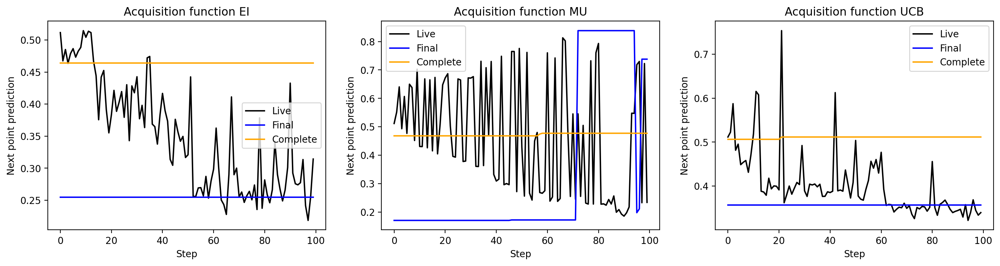

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("Acquisition function EI")
ax1.plot(s, nextpoint_pred_compare[0, 0,], c= 'black', label = "Live")
ax1.plot(s, nextpoint_pred_compare[0, 1,], c = 'blue', label = "Final")
ax1.plot(s, nextpoint_pred_compare[0, 2,], c = 'orange', label = "Complete")
ax1.set_ylabel("Next point prediction"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("Acquisition function MU")
ax2.plot(s, nextpoint_pred_compare[1, 0,], c= 'black', label = "Live")
ax2.plot(s, nextpoint_pred_compare[1, 1,], c = 'blue', label = "Final")
ax2.plot(s, nextpoint_pred_compare[1, 2,], c = 'orange', label = "Complete")
ax2.set_ylabel("Next point prediction"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("Acquisition function UCB")
ax3.plot(s, nextpoint_pred_compare[2, 0,], c= 'black', label = "Live")
ax3.plot(s, nextpoint_pred_compare[2, 1,], c = 'blue', label = "Final")
ax3.plot(s, nextpoint_pred_compare[2, 2,], c = 'orange', label = "Complete")
ax3.set_ylabel("Next point prediction"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

## Regret analysis

We define regret as the difference between live DKL prediction (mean) and final DKL prediction (mean).



In [ ]:
# Create array to save results of real time and matured DKL models
# save results from three acuqisition funciton
reg = np.empty((3, 2, exploration_steps))  # save the difference of predictions between real time DKL and trained DKL at each step; as well as deviation

for acq_idx in range (3):
  os.chdir (rf + acq_funcs[acq_idx] + save_mature_full)
  for i in range (exploration_steps):
    # load results
    rec = np.load("record{}.npz".format(i))
    mean_d = rec['mean']-rec['mean0']
    reg[acq_idx,:,i] = mean_d.mean(), np.std(mean_d)


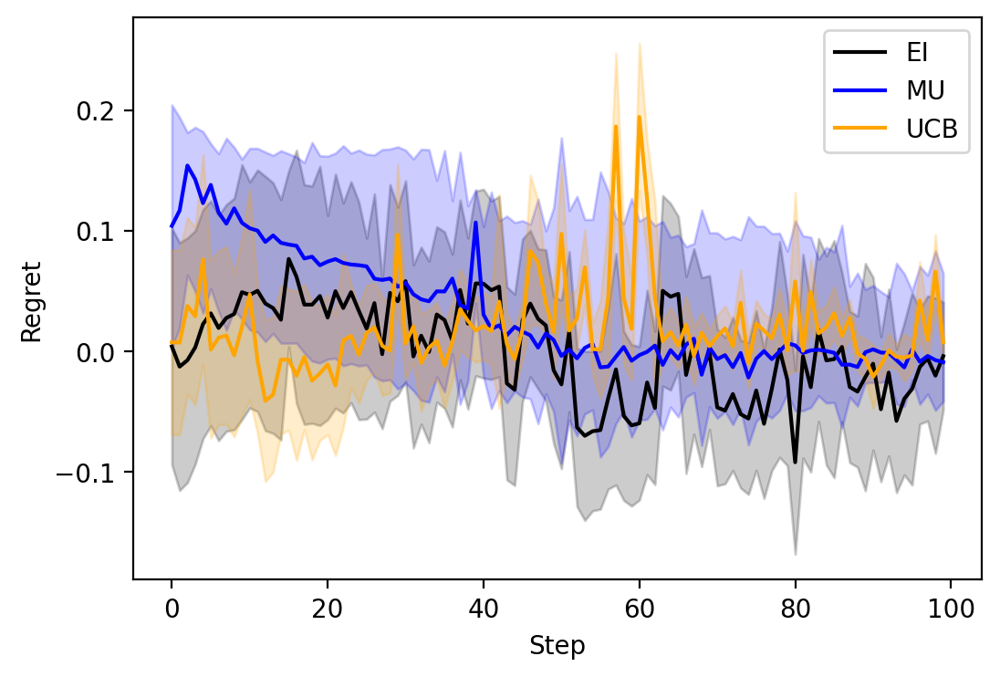

In [ ]:
fig, ax = plt.subplots(figsize = (6, 4), dpi = 200)

ax.plot(s, reg[0,0,], c= 'black', label = "EI")
ax.fill_between(s, reg[0,0,]-reg[0,1,], reg[0,0,]+reg[0,1,], 
                color='black', alpha=0.2)

ax.plot(s, reg[1,0,], c= 'blue', label = "MU")
ax.fill_between(s, reg[1,0,]-reg[1,1,], reg[1,1,]+reg[1,1,], 
                color='blue', alpha=0.2)

ax.plot(s, reg[2,0,], c= 'orange', label = "UCB")
ax.fill_between(s, reg[2,0,]-reg[2,1,], reg[2,0,]+reg[2,1,], 
                color='orange', alpha=0.2)

ax.set_ylabel("Regret")
ax.set_xlabel('Step')
plt.legend()
plt.show()

## Real space trajectory analysis

Now, let's explore the real space trajectories for the experiment with different acquisition functions. This allows us to compare how different acquisition functions explore the image plane, and in which sequence they pick different structural objects. 

In [ ]:
traj_EI = np.zeros((exploration_steps, 2))
traj_MU = np.zeros((exploration_steps, 2))
traj_UCB = np.zeros((exploration_steps, 2))

for i in range (exploration_steps):
  os.chdir (rf + acq_funcs[0] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_EI [i, ] = nextpoint

  try:
    os.chdir (rf + acq_funcs[1] + save_explore)
    rec = np.load("record{}.npz".format(i))
    nextpoint = rec ['next_point']
    traj_MU [i, ] = nextpoint
  except FileNotFoundError:
    pass
    
  os.chdir (rf + acq_funcs[2] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_UCB [i, ] = nextpoint

(-0.5, 62.5, -0.5, 32.5)

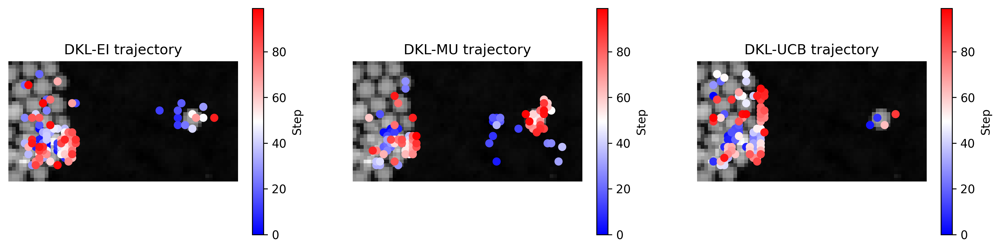

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi = 300)

cm = 'gray'
shrink = 0.7

ax1.imshow(full_img, interpolation='nearest', origin = "lower", cmap=cm)
im1 = ax1.scatter(traj_EI[:,1], traj_EI[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im1, ax=ax1, shrink = shrink, label = "Step")
ax1.set_title("DKL-EI trajectory")
ax1.axis('off')

ax2.imshow(full_img, interpolation='nearest', origin = "lower", cmap=cm)
im2 = ax2.scatter(traj_MU[:,1], traj_MU[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im2, ax=ax2, shrink = shrink, label = "Step")
ax2.set_title("DKL-MU trajectory")
ax2.axis('off')

ax3.imshow(full_img, interpolation='nearest', origin = "lower", cmap=cm)
im3 = ax3.scatter(traj_UCB[:,1], traj_UCB[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im3, ax=ax3, shrink = shrink, label = "Step")
ax3.set_title("DKL-UCB trajectory")
ax3.axis('off')

## Feature discovery

Here, we explore what are the characteristic structural elements of the points explored during the AE. To do it, we use the VAE (or invariant VAE) analysis of the image patches in the **experimental trace**.

First, we run it for the EI acquisition function

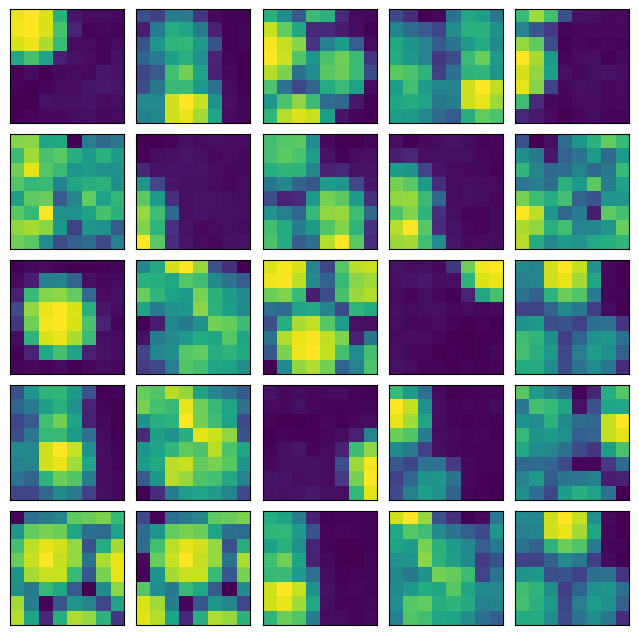

In [ ]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[0] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_EI_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_EI_loader = pv.utils.init_dataloader(vae_EI_data, batch_size=32, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_EI_data))
    ax.imshow(vae_EI_data[i].cpu(), interpolation='nearest')

In [ ]:
tensor = vae_EI_data

# Print tensor properties
print("Tensor properties:")
print("Data type:", tensor.dtype)
print("Device:", tensor.device)
print("Shape:", tensor.shape)
print("Number of dimensions:", tensor.dim())
print("Total number of elements:", tensor.numel())

Tensor properties:
Data type: torch.float32
Device: cuda:0
Shape: torch.Size([107, 8, 8])
Number of dimensions: 3
Total number of elements: 6848


In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_EI = pv.models.iVAE(in_dim, latent_dim=2, invariances='r', 
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_EI)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_EI_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 30227.5268
Epoch: 2 Training loss: 21856.7146
Epoch: 3 Training loss: 19966.1241
Epoch: 4 Training loss: 18436.8128
Epoch: 5 Training loss: 17195.9964
Epoch: 6 Training loss: 15244.7577
Epoch: 7 Training loss: 14136.0764
Epoch: 8 Training loss: 13088.2210
Epoch: 9 Training loss: 12723.1775
Epoch: 10 Training loss: 12222.9352
Epoch: 11 Training loss: 12005.9186
Epoch: 12 Training loss: 11622.6550
Epoch: 13 Training loss: 11470.0558
Epoch: 14 Training loss: 11172.9109
Epoch: 15 Training loss: 10729.3388
Epoch: 16 Training loss: 10348.0917
Epoch: 17 Training loss: 9825.4842
Epoch: 18 Training loss: 9547.8792
Epoch: 19 Training loss: 9229.3282
Epoch: 20 Training loss: 9235.0387
Epoch: 21 Training loss: 9355.1518
Epoch: 22 Training loss: 9060.6533
Epoch: 23 Training loss: 8884.3361
Epoch: 24 Training loss: 8664.7770
Epoch: 25 Training loss: 8702.5516
Epoch: 26 Training loss: 8517.4101
Epoch: 27 Training loss: 8437.7178
Epoch: 28 Training loss: 8413.2865
Epoch: 29 Tra

Text(0, 0.5, '$z_1$')

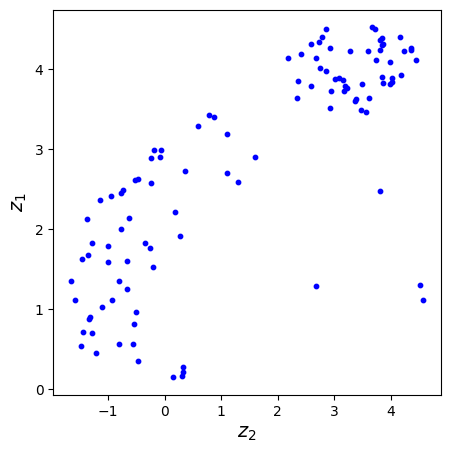

In [ ]:
z_mean_EI, z_sd_EI = rvae_EI.encode(vae_EI_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.scatter(z_mean_EI[:, -1], z_mean_EI[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

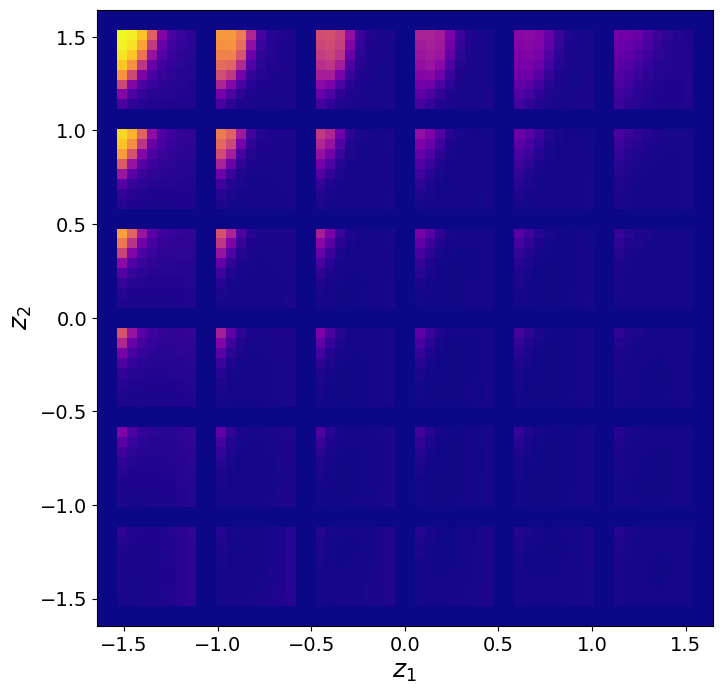

In [ ]:
rvae_EI.manifold2d(6, 
                   # z_coord = [z_mean_EI[:, -1].min(), z_mean_EI[:, -1].max(), z_mean_EI[:, -2].min(), z_mean_EI[:, -2].max()], 
                   cmap = 'plasma', dpi = 100);

Maximum uncertainty sampled data

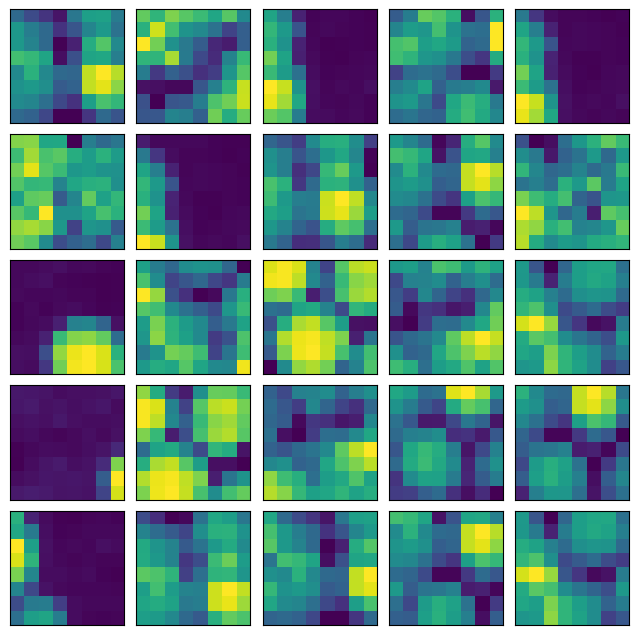

In [ ]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[1] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_MU_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_MU_loader = pv.utils.init_dataloader(vae_MU_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_MU_data))
    ax.imshow(vae_MU_data[i].cpu(), interpolation='nearest')

In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_MU = pv.models.iVAE(in_dim, latent_dim=2, invariances='r', 
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_MU)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_MU_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 42712.3902
Epoch: 2 Training loss: 28710.1315
Epoch: 3 Training loss: 24048.6171
Epoch: 4 Training loss: 22435.5470
Epoch: 5 Training loss: 20544.3326
Epoch: 6 Training loss: 20275.1846
Epoch: 7 Training loss: 19409.4512
Epoch: 8 Training loss: 17481.9697
Epoch: 9 Training loss: 16429.3953
Epoch: 10 Training loss: 14863.1232
Epoch: 11 Training loss: 13852.8390
Epoch: 12 Training loss: 13555.3294
Epoch: 13 Training loss: 12829.0909
Epoch: 14 Training loss: 12976.9463
Epoch: 15 Training loss: 12568.7012
Epoch: 16 Training loss: 12234.2460
Epoch: 17 Training loss: 12024.4449
Epoch: 18 Training loss: 11910.0705
Epoch: 19 Training loss: 11783.5099
Epoch: 20 Training loss: 11591.2612
Epoch: 21 Training loss: 11481.7540
Epoch: 22 Training loss: 11456.9148
Epoch: 23 Training loss: 11360.6612
Epoch: 24 Training loss: 11130.4844
Epoch: 25 Training loss: 11073.4995
Epoch: 26 Training loss: 10854.1983
Epoch: 27 Training loss: 10723.7281
Epoch: 28 Training loss: 10526.6775
E

Text(0, 0.5, '$z_1$')

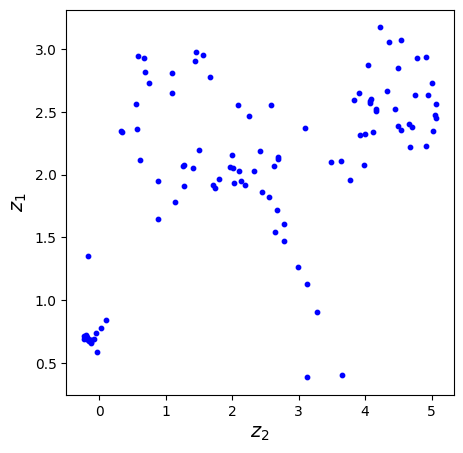

In [ ]:
z_mean_MU, z_sd_MU = rvae_MU.encode(vae_MU_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.scatter(z_mean_MU[:, -1], z_mean_MU[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

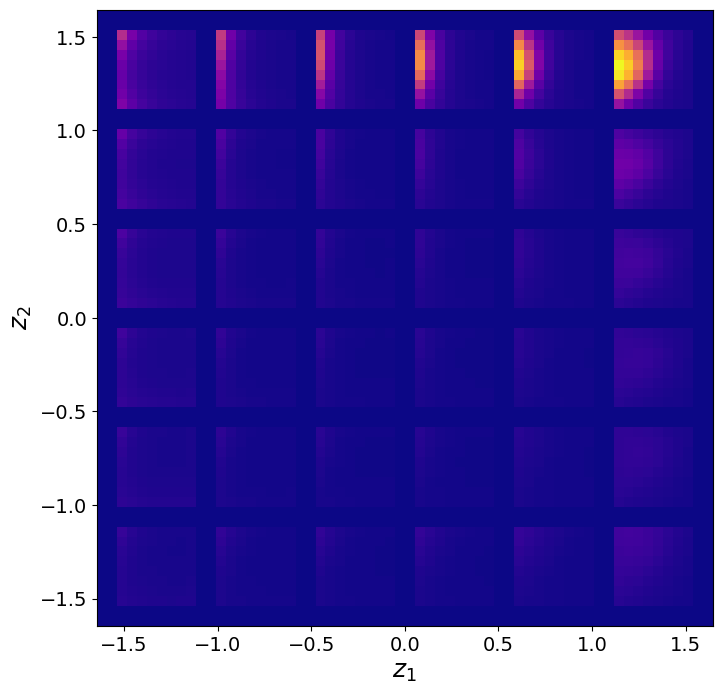

In [ ]:
rvae_MU.manifold2d(6, 
                   # z_coord = [z_mean_MU[:, -1].min(), z_mean_MU[:, -1].max(), z_mean_MU[:, -2].min(), z_mean_MU[:, -2].max()],
                   cmap = 'plasma', dpi = 100);

And finally UCB sampled data

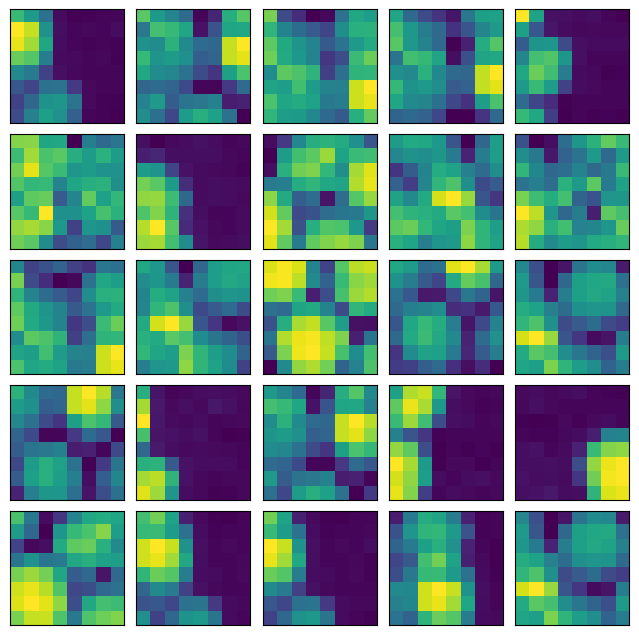

In [ ]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[2] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_UCB_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_UCB_loader = pv.utils.init_dataloader(vae_UCB_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_UCB_data))
    ax.imshow(vae_UCB_data[i].cpu(), interpolation='nearest')

In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_UCB = pv.models.iVAE(in_dim, latent_dim=2, invariances='r', 
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_UCB)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_UCB_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 33626.4899
Epoch: 2 Training loss: 23058.5910
Epoch: 3 Training loss: 20781.0772
Epoch: 4 Training loss: 20242.3238
Epoch: 5 Training loss: 18981.4294
Epoch: 6 Training loss: 18129.6503
Epoch: 7 Training loss: 17376.5618
Epoch: 8 Training loss: 15676.7720
Epoch: 9 Training loss: 15388.2911
Epoch: 10 Training loss: 13925.2382
Epoch: 11 Training loss: 12737.8029
Epoch: 12 Training loss: 12124.7898
Epoch: 13 Training loss: 11776.1988
Epoch: 14 Training loss: 11441.3685
Epoch: 15 Training loss: 11287.8426
Epoch: 16 Training loss: 10857.3576
Epoch: 17 Training loss: 10584.7550
Epoch: 18 Training loss: 10264.5972
Epoch: 19 Training loss: 10187.3286
Epoch: 20 Training loss: 10001.1580
Epoch: 21 Training loss: 9940.9754
Epoch: 22 Training loss: 9681.5144
Epoch: 23 Training loss: 9364.1987
Epoch: 24 Training loss: 9101.1884
Epoch: 25 Training loss: 9132.8127
Epoch: 26 Training loss: 8753.0173
Epoch: 27 Training loss: 8498.6271
Epoch: 28 Training loss: 8403.2645
Epoch: 29

Text(0, 0.5, '$z_1$')

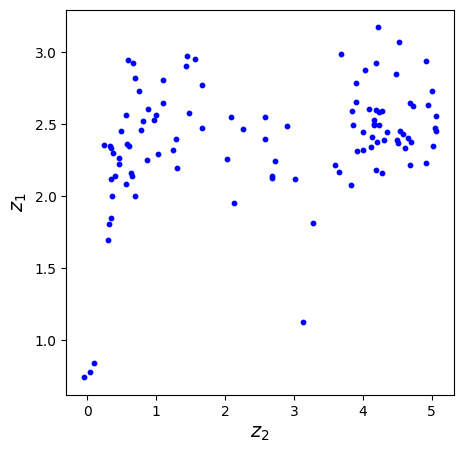

In [ ]:
z_mean_UCB, z_sd_UCB = rvae_MU.encode(vae_UCB_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.scatter(z_mean_UCB[:, -1], z_mean_UCB[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

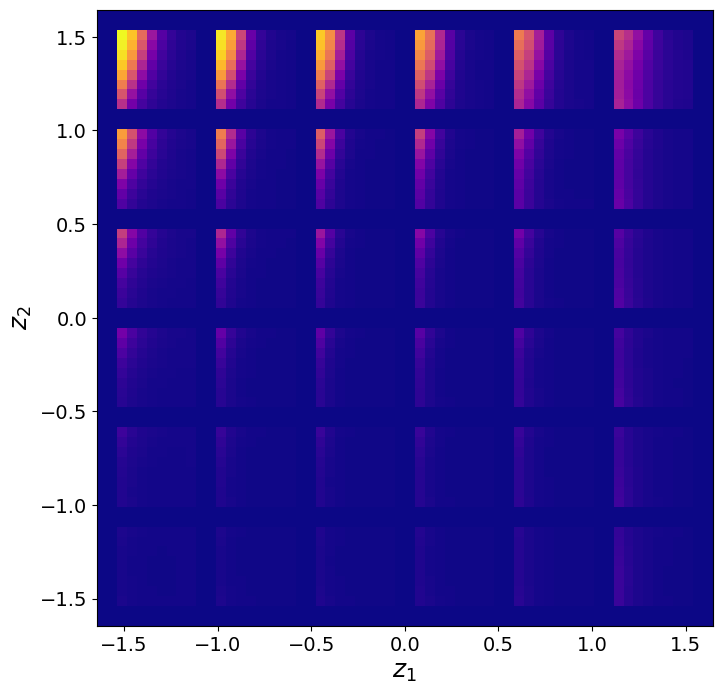

In [ ]:
rvae_UCB.manifold2d(6, 
                    # z_coord = [z_mean_UCB[:, -1].min(), z_mean_UCB[:, -1].max(), z_mean_UCB[:, -2].min(), z_mean_UCB[:, -2].max()],
                    cmap = 'plasma', dpi = 100);

## Latent trajectory analysis

Here, we analyze the feature space (i.e. latent space) of the full set of image patches, and plot the AE trajectories in this latent space. 

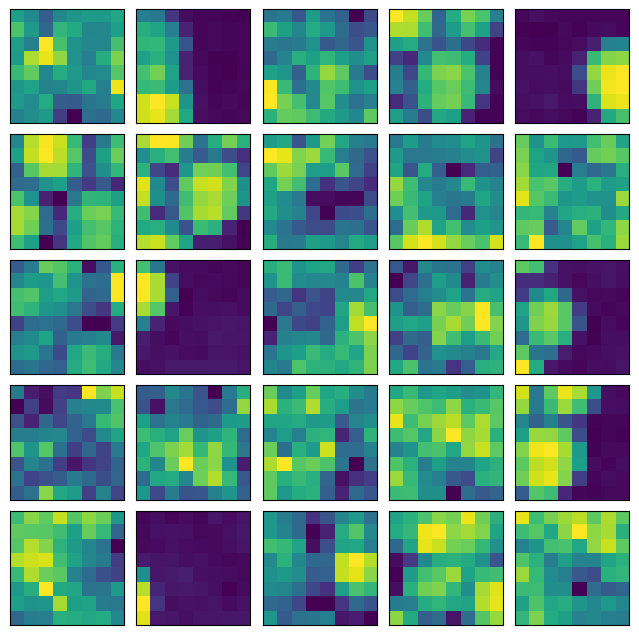

In [ ]:
# Initialize VAE train loader
vae_all_data = torch.tensor(X.reshape(-1, ws, ws)).float()
vae_all_loader = pv.utils.init_dataloader(vae_all_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_all_data))
    ax.imshow(vae_all_data[i].cpu(), interpolation='nearest')

In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_all = pv.models.iVAE(in_dim, latent_dim=2, invariances='r', 
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_all)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_all_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 17093.9062
Epoch: 2 Training loss: 4200.2963
Epoch: 3 Training loss: 3684.8447
Epoch: 4 Training loss: 3542.1555
Epoch: 5 Training loss: 3407.1163
Epoch: 6 Training loss: 3241.4808
Epoch: 7 Training loss: 3094.0519
Epoch: 8 Training loss: 2964.9138
Epoch: 9 Training loss: 2883.3434
Epoch: 10 Training loss: 2816.2066
Epoch: 11 Training loss: 2766.7281
Epoch: 12 Training loss: 2730.1274
Epoch: 13 Training loss: 2710.5282
Epoch: 14 Training loss: 2694.4630
Epoch: 15 Training loss: 2732.4353
Epoch: 16 Training loss: 2628.2767
Epoch: 17 Training loss: 2615.9346
Epoch: 18 Training loss: 2620.0669
Epoch: 19 Training loss: 2606.9584
Epoch: 20 Training loss: 2576.8770
Epoch: 21 Training loss: 2573.1115
Epoch: 22 Training loss: 2574.7417
Epoch: 23 Training loss: 2592.9082
Epoch: 24 Training loss: 2610.2593
Epoch: 25 Training loss: 2542.5744
Epoch: 26 Training loss: 2502.7125
Epoch: 27 Training loss: 2483.8468
Epoch: 28 Training loss: 2458.4172
Epoch: 29 Training loss: 244

Text(0, 0.5, '$z_1$')

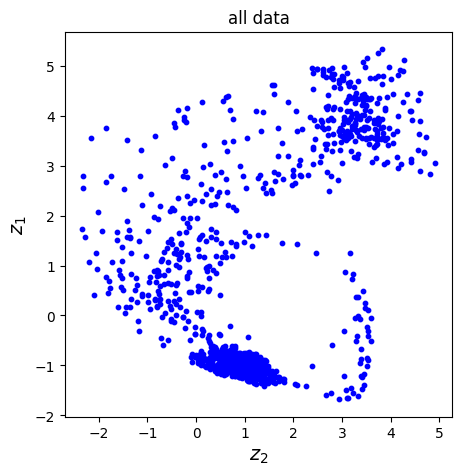

In [ ]:
z_mean_all, z_sd_all = rvae_all.encode(vae_all_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.title('all data')
plt.scatter(z_mean_all[:, -1], z_mean_all[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

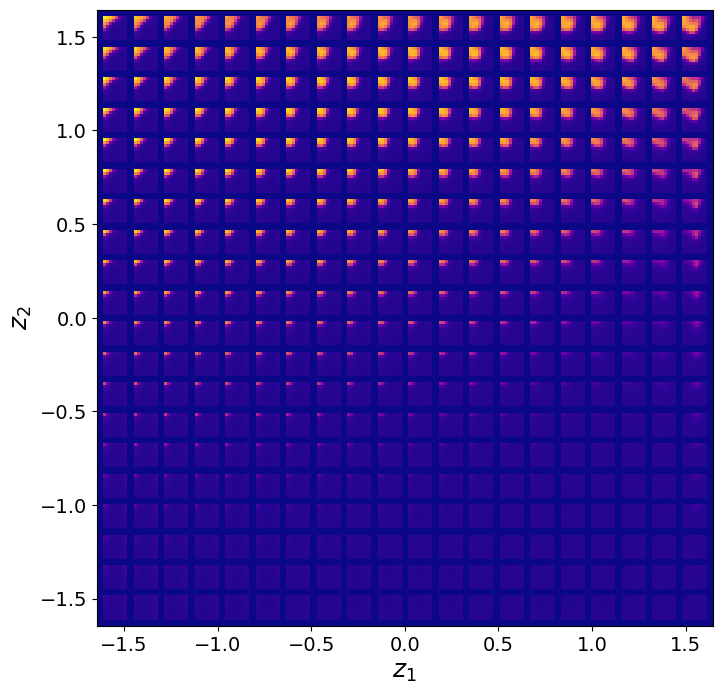

In [ ]:
rvae_all.manifold2d(20,
                    #z_coord = [z_mean_all[:, -1].min(), z_mean_all[:, -1].max(), z_mean_all[:, -2].min(), z_mean_all[:, -2].max()],
                    cmap = 'plasma', dpi = 300);

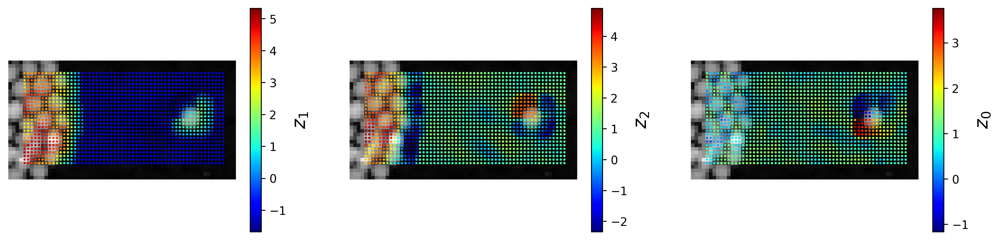

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi = 300)
ax1.imshow(full_img, origin = "lower", cmap = 'gray')
im1=ax1.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-2], cmap = 'jet')
ax1.axis(False)
cbar1 = fig.colorbar(im1, ax=ax1, shrink=.7)
cbar1.set_label("$z_1$", fontsize=16)

ax2.imshow(full_img, origin = "lower", cmap = 'gray')
im2=ax2.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-1], cmap = 'jet')
ax2.axis(False)
cbar2 = fig.colorbar(im2, ax=ax2, shrink=.7)
cbar2.set_label("$z_2$", fontsize=16)

im3=ax3.imshow(full_img, origin = "lower", cmap = 'gray')
im3=ax3.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-3], cmap = 'jet')
ax3.axis(False)
cbar3 = fig.colorbar(im3, ax=ax3, shrink=.7)
cbar3.set_label("$z_0$", fontsize=16)

Plot samplings (from different acquition functions) distribution in the latent space of all patches

In [ ]:
import pandas as pd
import seaborn as sns

z1 = np.asarray(z_mean_all, dtype = np.float32); 
z2 = np.asarray(z_mean_EI, dtype = np.float32)
d = np.append(z1, z2, axis = 0)

s = pd.DataFrame({"z0": d[:,0], "z1": d[:,1], "z2": d[:,2]})

#, "Data": 'All Data'})
#s['Data'][len(z1):] = "DKL Train Data"

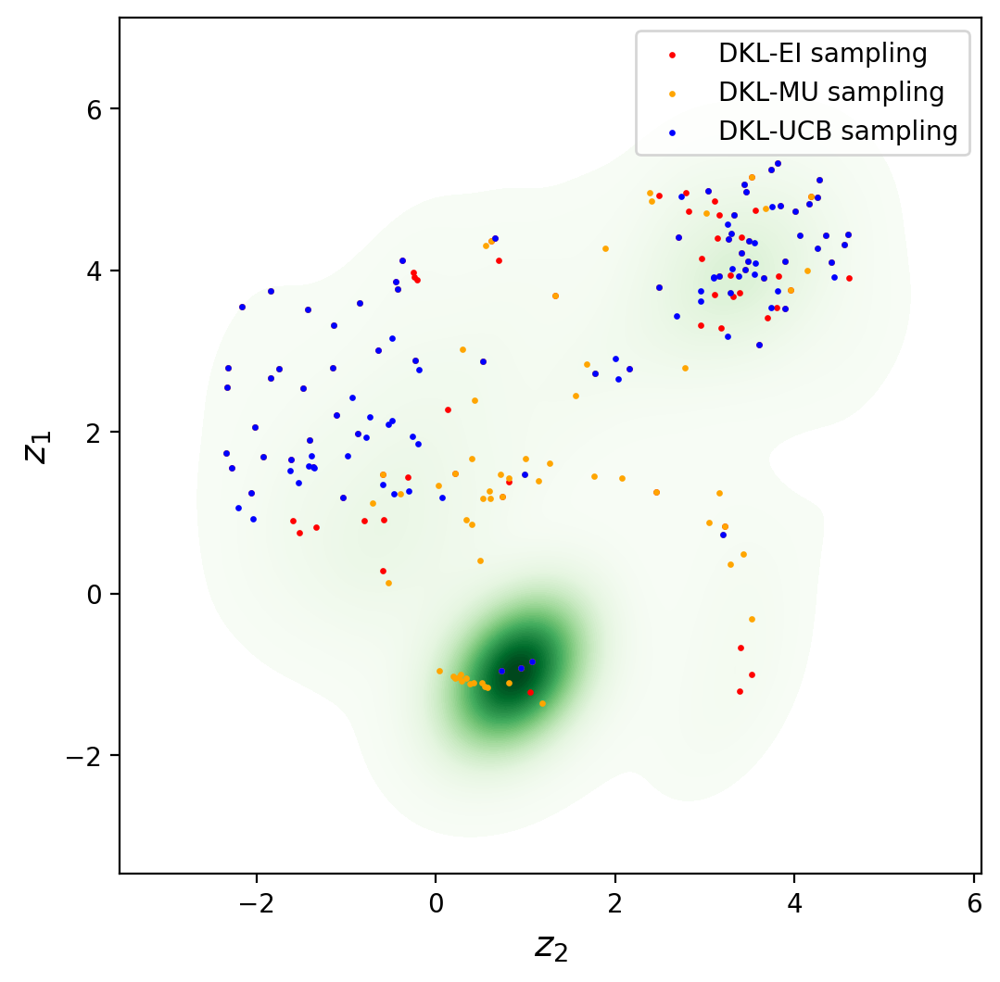

In [ ]:
z_mean_all_EI, z_sd_all_EI = rvae_all.encode(vae_EI_data)
z_mean_all_MU, z_sd_all_MU = rvae_all.encode(vae_MU_data)
z_mean_all_UCB, z_sd_all_UCB = rvae_all.encode(vae_UCB_data)

f, ax = plt.subplots(figsize = (6,6), dpi = 200)

#data = z1
#s = pd.DataFrame({"z0": data[:,0], "z1": data[:,1], "z2": data[:,2]})
ax = sns.kdeplot(data=s, x = "z2", y = "z1", fill=True, thresh=0.01, levels=100, cmap="Greens")
# ax.set_ylim(-5, 5)
# ax.set_xlim(-5, 5)

#ax.scatter(z_mean_all[:, -1], z_mean_all[:, -2], c = 'gray', s=0.5, label = "Full patches")
ax.scatter(z_mean_all_EI[:, -1], z_mean_all_EI[:, -2], c='r', marker = 'o', s=2, label = "DKL-EI sampling")
ax.scatter(z_mean_all_MU[:, -1], z_mean_all_MU[:, -2], c='orange', marker = 'o', s=2, label = "DKL-MU sampling")
ax.scatter(z_mean_all_UCB[:, -1], z_mean_all_UCB[:, -2], c='blue', marker = 'o', s=2, label = "DKL-UCB sampling")
ax.set_xlabel("$z_2$", fontsize=14)
ax.set_ylabel("$z_1$", fontsize=14)

ax.legend()

# Summary and definitions

Summary of the definitions for forensic descriptors.

- **Global image:** Initial structural data set available before DKL experiment. Used to create patches for DKL training	

- **DKL latents:**	The latent variables encoding the structural information in the patches

- **Scalarizer function:**	Function defining what characteristic of spectrum guides Bayesian Optimization

- **Acquisition function:**	Function combining DKL prediction and uncertainty of the scalarizer function 	

- **Policy:**	Principle for selection of next path. Simplest policy is maximization of **acquisition function**, but can be more complex including epsilon-greedy or switch between multiple scalarizers or acquisition functions. Human in the loop intervention tunes some aspect of the policy

- **Experimental trace:**	Collection of patches (and their coordinates) and spectra derived during experiment. Trace and global image are the results of AE microscopy.	

- **Live DKL model:**	DKL model in the state corresponding to the n-th experimental step

- **Final DKL model:**	DKL model in the state corresponding to the end of the experiment	

- **Complete DKL model:**	DKL model trained on the full data set (if available from grid measurements, etc). 

- **Regret analysis:**	The difference between predictions of live DKL model and final DKL model after the whole experiment (i.e., after 200 steps in this work)	

- **Learning curve:**	Change of the DKL uncertainty (mean and deviation), indicative of the predictability of the patch-scalarizer relationship	

- **Counterfactual scalarizer:**	The availability of full spectral data as a part of experimental trace allows to estimate what the BO step would be if scalarizer were chosen to be different

- **Trajectory analysis:**	Real-time trajectory of the probe that can be represented in the global image plane	

- **Feature discovery:**	Analysis of the latent variables and latent representations of image patches and spectra in the trace. Here, we realize only patch analysis but extension to spectra is straightforward. 	

- **Latent trajectory analysis:** 	Analysis of the experimental trajectory in the latent space of the full collection of the image patches derived from the global image
